# 1.GIỚI THIỆU

Bộ dữ liệu thương mại điện tử công khai Brazil của Olist (https://www.kaggle.com/datasets/olistbr/brazilian-ecommerce)

Đây là bộ dữ liệu thương mại điện tử công khai của Brazil về các đơn hàng được thực hiện tại Olist Store. Bộ dữ liệu này chứa thông tin về 100.000 đơn hàng từ năm 2016 đến 2018, được thực hiện trên nhiều marketplace khác nhau ở Brazil. Các đặc trưng trong dữ liệu cho phép xem một đơn hàng từ nhiều khía cạnh: từ trạng thái đơn hàng, giá cả, phương thức thanh toán và hiệu suất vận chuyển, đến vị trí khách hàng, thuộc tính sản phẩm, và cuối cùng là các đánh giá do khách hàng viết. Chúng tôi cũng đã phát hành một bộ dữ liệu địa lý (geolocation) liên kết mã zip của Brazil với tọa độ vĩ/kinh độ.

Với bộ dữ liệu gốc đưa chia làm 9 file, sau khi tổng hợp lại các cột tạo thành một file chứa tất cả các cột của 9 file gốc.

Dữ liệu được chia thành nhiều bộ dữ liệu riêng biệt để dễ hiểu và dễ quản lý hơn. Vui lòng tham khảo sơ đồ dữ liệu (data schema) sau khi làm việc với bộ dữ liệu này:
![](olist.png)

In [1]:
import pandas as pd
import numpy as np

In [2]:
df = pd.read_csv("master_data.csv")
df

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,order_item_id,product_id,...,customer_state,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,delivery_days,is_late,review_binary
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,1.0,87285b34884572647811a353c7ac498a,...,SP,a54f0611adc9ed256b57ede6b6eb5114,4.0,NaN,"Não testei o produto ainda, mas ele veio corre...",2017-10-11 00:00:00,2017-10-12 03:43:48,8,0,1
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,1.0,595fac2a385ac33a80bd5114aec74eb8,...,BA,8d5266042046a06655c8db133d120ba5,4.0,Muito boa a loja,Muito bom o produto.,2018-08-08 00:00:00,2018-08-08 18:37:50,13,0,1
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,1.0,aa4383b373c6aca5d8797843e5594415,...,GO,e73b67b67587f7644d5bd1a52deb1b01,5.0,NaN,NaN,2018-08-18 00:00:00,2018-08-22 19:07:58,9,0,1
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,1.0,d0b61bfb1de832b15ba9d266ca96e5b0,...,RN,359d03e676b3c069f62cadba8dd3f6e8,5.0,NaN,O produto foi exatamente o que eu esperava e e...,2017-12-03 00:00:00,2017-12-05 19:21:58,13,0,1
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26,1.0,65266b2da20d04dbe00c5c2d3bb7859e,...,SP,e50934924e227544ba8246aeb3770dd4,5.0,NaN,NaN,2018-02-17 00:00:00,2018-02-18 13:02:51,2,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
110007,63943bddc261676b46f01ca7ac2f7bd8,1fca14ff2861355f6e5f14306ff977a7,delivered,2018-02-06 12:58:58,2018-02-06 13:10:37,2018-02-07 23:22:42,2018-02-28 17:37:56,2018-03-02,1.0,f1d4ce8c6dd66c47bbaa8c6781c2a923,...,SP,29bb71b2760d0f876dfa178a76bc4734,4.0,NaN,So uma peça que veio rachado mas tudo bem rs,2018-03-01 00:00:00,2018-03-02 17:50:01,22,0,1
110008,83c1379a015df1e13d02aae0204711ab,1aa71eb042121263aafbe80c1b562c9c,delivered,2017-08-27 14:46:43,2017-08-27 15:04:16,2017-08-28 20:52:26,2017-09-21 11:24:17,2017-09-27,1.0,b80910977a37536adeddd63663f916ad,...,BA,371579771219f6db2d830d50805977bb,5.0,NaN,Foi entregue antes do prazo.,2017-09-22 00:00:00,2017-09-22 23:10:57,24,0,1
110009,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,delivered,2018-01-08 21:28:27,2018-01-08 21:36:21,2018-01-12 15:35:03,2018-01-25 23:32:54,2018-02-15,1.0,d1c427060a0f73f6b889a5c7c61f2ac4,...,RJ,8ab6855b9fe9b812cd03a480a25058a1,2.0,NaN,Foi entregue somente 1. Quero saber do outro p...,2018-01-26 00:00:00,2018-01-27 09:16:56,17,0,0
110010,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,delivered,2018-01-08 21:28:27,2018-01-08 21:36:21,2018-01-12 15:35:03,2018-01-25 23:32:54,2018-02-15,2.0,d1c427060a0f73f6b889a5c7c61f2ac4,...,RJ,8ab6855b9fe9b812cd03a480a25058a1,2.0,NaN,Foi entregue somente 1. Quero saber do outro p...,2018-01-26 00:00:00,2018-01-27 09:16:56,17,0,0


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 110012 entries, 0 to 110011
Data columns (total 35 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   order_id                       110012 non-null  object 
 1   customer_id                    110012 non-null  object 
 2   order_status                   110012 non-null  object 
 3   order_purchase_timestamp       110012 non-null  object 
 4   order_approved_at              109997 non-null  object 
 5   order_delivered_carrier_date   110011 non-null  object 
 6   order_delivered_customer_date  110012 non-null  object 
 7   order_estimated_delivery_date  110012 non-null  object 
 8   order_item_id                  110012 non-null  float64
 9   product_id                     110012 non-null  object 
 10  seller_id                      110012 non-null  object 
 11  shipping_limit_date            110012 non-null  object 
 12  price                         

Số lượng dòng: 110,012

Số cột: 35

Một số cột numeric có missing ít (product_weight_g, product_length_cm…), có thể điền median.

Một số cột text (review_comment_title, review_comment_message) missing nhiều, ~60–70% → khó dùng trực tiếp, có thể tạo feature nhị phân “có review text hay không”.

Một số cột categorical có missing nhỏ (product_category_name) → điền "Unknown" hoặc "Missing"

Numeric: price, freight_value, delivery_days, product dimensions, review_score → có thể dùng trực tiếp sau chuẩn hóa.

Categorical: order_status, customer_state, product_category_name, product_id, seller_id → cần encode.

Datetime: order_purchase_timestamp, order_delivered_customer_date, order_estimated_delivery_date → có thể tạo feature mới như delivery_delay.

Text: review_comment_message, review_comment_title → khó dùng trực tiếp, có thể trích feature phụ (có hay không, độ dài, sentiment…).

## 1.1. TIỀN XỬ LÝ DỮ LIỆU

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 110012 entries, 0 to 110011
Data columns (total 35 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   order_id                       110012 non-null  object 
 1   customer_id                    110012 non-null  object 
 2   order_status                   110012 non-null  object 
 3   order_purchase_timestamp       110012 non-null  object 
 4   order_approved_at              109997 non-null  object 
 5   order_delivered_carrier_date   110011 non-null  object 
 6   order_delivered_customer_date  110012 non-null  object 
 7   order_estimated_delivery_date  110012 non-null  object 
 8   order_item_id                  110012 non-null  float64
 9   product_id                     110012 non-null  object 
 10  seller_id                      110012 non-null  object 
 11  shipping_limit_date            110012 non-null  object 
 12  price                         

### 1.1.1. Kiểm trai dữ liệu thiếu

In [5]:
df.isnull().sum()

order_id                             0
customer_id                          0
order_status                         0
order_purchase_timestamp             0
order_approved_at                   15
order_delivered_carrier_date         1
order_delivered_customer_date        0
order_estimated_delivery_date        0
order_item_id                        0
product_id                           0
seller_id                            0
shipping_limit_date                  0
price                                0
freight_value                        0
product_category_name             1555
product_name_lenght               1533
product_description_lenght        1533
product_photos_qty                1533
product_weight_g                    18
product_length_cm                   18
product_height_cm                   18
product_width_cm                    18
customer_unique_id                   0
customer_zip_code_prefix             0
customer_city                        0
customer_state           

In [6]:
df = df[
    df['order_approved_at'].notna() &
    df['order_delivered_carrier_date'].notna()].reset_index(drop=True)

In [7]:
df.isnull().sum()

order_id                             0
customer_id                          0
order_status                         0
order_purchase_timestamp             0
order_approved_at                    0
order_delivered_carrier_date         0
order_delivered_customer_date        0
order_estimated_delivery_date        0
order_item_id                        0
product_id                           0
seller_id                            0
shipping_limit_date                  0
price                                0
freight_value                        0
product_category_name             1554
product_name_lenght               1532
product_description_lenght        1532
product_photos_qty                1532
product_weight_g                    18
product_length_cm                   18
product_height_cm                   18
product_width_cm                    18
customer_unique_id                   0
customer_zip_code_prefix             0
customer_city                        0
customer_state           

In [8]:
df['product_name_lenght'] = df['product_name_lenght'].fillna(0)
df['product_description_lenght'] = df['product_description_lenght'].fillna(0)
df['product_photos_qty'] = df['product_photos_qty'].fillna(0)

In [9]:
df['product_category_name'] = df['product_category_name'].fillna('unknown')

In [10]:
df.isnull().sum()

order_id                             0
customer_id                          0
order_status                         0
order_purchase_timestamp             0
order_approved_at                    0
order_delivered_carrier_date         0
order_delivered_customer_date        0
order_estimated_delivery_date        0
order_item_id                        0
product_id                           0
seller_id                            0
shipping_limit_date                  0
price                                0
freight_value                        0
product_category_name                0
product_name_lenght                  0
product_description_lenght           0
product_photos_qty                   0
product_weight_g                    18
product_length_cm                   18
product_height_cm                   18
product_width_cm                    18
customer_unique_id                   0
customer_zip_code_prefix             0
customer_city                        0
customer_state           

In [11]:
df['product_weight_g'] = df['product_weight_g'].fillna(0)
df['product_length_cm'] = df['product_length_cm'].fillna(0)
df['product_height_cm'] = df['product_height_cm'].fillna(0)
df['product_width_cm'] = df['product_width_cm'].fillna(0)

In [12]:
df.isnull().sum()

order_id                             0
customer_id                          0
order_status                         0
order_purchase_timestamp             0
order_approved_at                    0
order_delivered_carrier_date         0
order_delivered_customer_date        0
order_estimated_delivery_date        0
order_item_id                        0
product_id                           0
seller_id                            0
shipping_limit_date                  0
price                                0
freight_value                        0
product_category_name                0
product_name_lenght                  0
product_description_lenght           0
product_photos_qty                   0
product_weight_g                     0
product_length_cm                    0
product_height_cm                    0
product_width_cm                     0
customer_unique_id                   0
customer_zip_code_prefix             0
customer_city                        0
customer_state           

In [13]:
df['review_comment_title'] = df['review_comment_title'].fillna("")
df['review_comment_message'] = df['review_comment_message'].fillna("")

In [14]:
df.isnull().sum()

order_id                         0
customer_id                      0
order_status                     0
order_purchase_timestamp         0
order_approved_at                0
order_delivered_carrier_date     0
order_delivered_customer_date    0
order_estimated_delivery_date    0
order_item_id                    0
product_id                       0
seller_id                        0
shipping_limit_date              0
price                            0
freight_value                    0
product_category_name            0
product_name_lenght              0
product_description_lenght       0
product_photos_qty               0
product_weight_g                 0
product_length_cm                0
product_height_cm                0
product_width_cm                 0
customer_unique_id               0
customer_zip_code_prefix         0
customer_city                    0
customer_state                   0
review_id                        0
review_score                     0
review_comment_title

In [15]:
df

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,order_item_id,product_id,...,customer_state,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,delivery_days,is_late,review_binary
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,1.0,87285b34884572647811a353c7ac498a,...,SP,a54f0611adc9ed256b57ede6b6eb5114,4.0,,"Não testei o produto ainda, mas ele veio corre...",2017-10-11 00:00:00,2017-10-12 03:43:48,8,0,1
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,1.0,595fac2a385ac33a80bd5114aec74eb8,...,BA,8d5266042046a06655c8db133d120ba5,4.0,Muito boa a loja,Muito bom o produto.,2018-08-08 00:00:00,2018-08-08 18:37:50,13,0,1
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,1.0,aa4383b373c6aca5d8797843e5594415,...,GO,e73b67b67587f7644d5bd1a52deb1b01,5.0,,,2018-08-18 00:00:00,2018-08-22 19:07:58,9,0,1
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,1.0,d0b61bfb1de832b15ba9d266ca96e5b0,...,RN,359d03e676b3c069f62cadba8dd3f6e8,5.0,,O produto foi exatamente o que eu esperava e e...,2017-12-03 00:00:00,2017-12-05 19:21:58,13,0,1
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26,1.0,65266b2da20d04dbe00c5c2d3bb7859e,...,SP,e50934924e227544ba8246aeb3770dd4,5.0,,,2018-02-17 00:00:00,2018-02-18 13:02:51,2,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
109991,63943bddc261676b46f01ca7ac2f7bd8,1fca14ff2861355f6e5f14306ff977a7,delivered,2018-02-06 12:58:58,2018-02-06 13:10:37,2018-02-07 23:22:42,2018-02-28 17:37:56,2018-03-02,1.0,f1d4ce8c6dd66c47bbaa8c6781c2a923,...,SP,29bb71b2760d0f876dfa178a76bc4734,4.0,,So uma peça que veio rachado mas tudo bem rs,2018-03-01 00:00:00,2018-03-02 17:50:01,22,0,1
109992,83c1379a015df1e13d02aae0204711ab,1aa71eb042121263aafbe80c1b562c9c,delivered,2017-08-27 14:46:43,2017-08-27 15:04:16,2017-08-28 20:52:26,2017-09-21 11:24:17,2017-09-27,1.0,b80910977a37536adeddd63663f916ad,...,BA,371579771219f6db2d830d50805977bb,5.0,,Foi entregue antes do prazo.,2017-09-22 00:00:00,2017-09-22 23:10:57,24,0,1
109993,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,delivered,2018-01-08 21:28:27,2018-01-08 21:36:21,2018-01-12 15:35:03,2018-01-25 23:32:54,2018-02-15,1.0,d1c427060a0f73f6b889a5c7c61f2ac4,...,RJ,8ab6855b9fe9b812cd03a480a25058a1,2.0,,Foi entregue somente 1. Quero saber do outro p...,2018-01-26 00:00:00,2018-01-27 09:16:56,17,0,0
109994,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,delivered,2018-01-08 21:28:27,2018-01-08 21:36:21,2018-01-12 15:35:03,2018-01-25 23:32:54,2018-02-15,2.0,d1c427060a0f73f6b889a5c7c61f2ac4,...,RJ,8ab6855b9fe9b812cd03a480a25058a1,2.0,,Foi entregue somente 1. Quero saber do outro p...,2018-01-26 00:00:00,2018-01-27 09:16:56,17,0,0


In [16]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 109996 entries, 0 to 109995
Data columns (total 35 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   order_id                       109996 non-null  object 
 1   customer_id                    109996 non-null  object 
 2   order_status                   109996 non-null  object 
 3   order_purchase_timestamp       109996 non-null  object 
 4   order_approved_at              109996 non-null  object 
 5   order_delivered_carrier_date   109996 non-null  object 
 6   order_delivered_customer_date  109996 non-null  object 
 7   order_estimated_delivery_date  109996 non-null  object 
 8   order_item_id                  109996 non-null  float64
 9   product_id                     109996 non-null  object 
 10  seller_id                      109996 non-null  object 
 11  shipping_limit_date            109996 non-null  object 
 12  price                         

### 1.1.2. Kiểm tra dữ liệu trùng

In [17]:
df.duplicated().sum()

np.int64(0)

### 1.1.3. Thống kê mô tả

In [18]:
print("=== 1. THỐNG KÊ MÔ TẢ CHO BIẾN SỐ (NUMERIC) ===")
numeric_stats = df.describe()
display(numeric_stats)

=== 1. THỐNG KÊ MÔ TẢ CHO BIẾN SỐ (NUMERIC) ===


,order_item_id,price,freight_value,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,customer_zip_code_prefix,review_score,delivery_days,is_late,review_binary
count,109996.000000,109996.000000,109996.000000,109996.000000,109996.000000,109996.000000,109996.000000,109996.000000,109996.000000,109996.000000,109996.000000,109996.000000,109996.000000,109996.000000,109996.000000
mean,1.196380,119.694168,19.933329,48.131632,775.389451,2.177434,2085.508409,30.133950,16.534674,22.983472,35164.373959,4.081130,11.969963,0.077821,0.768001
std,0.692672,180.760973,15.667114,11.465855,652.785064,1.727423,3736.846763,16.109574,13.400764,11.688345,29923.820018,1.347803,9.362436,0.267891,0.422110
min,1.000000,0.850000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1003.000000,1.000000,0.000000,0.000000,0.000000
25%,1.000000,39.900000,13.070000,42.000000,341.000000,1.000000,300.000000,18.000000,8.000000,15.000000,11250.000000,4.000000,6.000000,0.000000,1.000000
50%,1.000000,74.900000,16.250000,51.000000,594.000000,1.000000,700.000000,25.000000,13.000000,20.000000,24340.000000,5.000000,10.000000,0.000000,1.000000
75%,1.000000,133.900000,21.150000,57.000000,978.000000,3.000000,1800.000000,38.000000,20.000000,30.000000,59074.250000,5.000000,15.000000,0.000000,1.000000
max,21.000000,6735.000000,409.680000,76.000000,3992.000000,20.000000,40425.000000,105.000000,105.000000,118.000000,99980.000000,5.000000,208.000000,1.000000,1.000000


**Đặc trưng về sản phẩm (Product features)**:

* product_name_length

Mean ≈ 48 ký tự

Min = 0 → có sản phẩm bị thiếu tên

Max = 76 → tên sản phẩm dài nhất

Đa số nằm từ 42 → 57 ký tự

=> Tên sản phẩm ở mức vừa, có vài trường hợp thiếu.

* product_description_length

Mean = 775 ký tự

Min = 0 (thiếu mô tả)

Max = 3992 ký tự

=> Mô tả sản phẩm rất dài trung bình → nhiều thông tin. Nhưng vẫn có sản phẩm thiếu hoàn toàn mô tả (0).

* product_photos_qty

Mean = 2.17 ảnh / sản phẩm

75% = 3 ảnh

Max = 20 ảnh

=> Đa số sản phẩm có ít ảnh, nhưng vẫn có sản phẩm nhiều hình → đa dạng.

---

**Đặc trưng kích thước và trọng lượng sản phẩm**:

* product_weight_g

Mean ≈ 2085g (2kg)

Std = rất lớn → dữ liệu phân tán cao

Min = 0g (dữ liệu lỗi)

Max = 40kg

=> Vì có một vài dữ liệu thiếu (không có tên sản phẩm) gán kích thước vào bằng 0.

* product_length_cm, height_cm, width_cm

Các giá trị Min = 0 tương tự như trên

Trung bình:

Dài ≈ 30 cm

Cao ≈ 16 cm

Rộng ≈ 23 cm

=> Kích thước hợp lý với hàng tiêu dùng (đồ gia dụng nhỏ, phụ kiện).

---

**Đặc trưng giá bán & vận chuyển**:

* price

Mean ≈ 119.7 BRL

Median = 74.9 BRL → phân phối lệch phải (nhiều hàng giá rẻ)

Max = 6735 BRL → có hàng cực đắt

=> Giá sản phẩm rất đa dạng, từ rất rẻ → rất đắt.

* freight_value (phí ship)

Mean ≈ 19.93 BRL

Min = 0 (một số sản phẩm free ship)

Max = 409 BRL

=> Phí ship chiếm tỉ lệ khá lớn so với giá hàng.

---

**Đặc trưng giao hàng**:

* delivery_days

Mean = 11.97 ngày

50% = 10 ngày

75% = 15 ngày

Max = 208 ngày → cực kỳ lâu (ngoại lệ)

=> Giao hàng trung bình khoảng 10–12 ngày.

* is_late

Mean = 0.077 (7.8%)

=> Khoảng 7–8% đơn hàng giao trễ so với estimated date.

---

**Đặc trưng đánh giá (review)**:

* review_score

Mean = 4.08

Median = 5

=> Khách hàng Brazil đánh giá khá cao, dữ liệu lệch về phía tích cực.

* review_binary (1 = tốt, 0 = xấu)

Mean = 0.768

=> 76.8% đánh giá là tốt (4–5 sao).

In [19]:
print("\n=== 2. THỐNG KÊ MÔ TẢ CHO BIẾN PHÂN LOẠI (OBJECT) ===")
categorical_stats = df.describe(include="object")
display(categorical_stats)


=== 2. THỐNG KÊ MÔ TẢ CHO BIẾN PHÂN LOẠI (OBJECT) ===


,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,product_id,seller_id,shipping_limit_date,product_category_name,customer_unique_id,customer_city,customer_state,review_id,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
count,109996,109996,109996,109996,109996,109996,109996,109996,109996,109996,109996,109996,109996,109996,109996,109996,109996,109996,109996,109996
unique,95815,95815,2,95300,87724,79598,95007,445,32066,2965,90741,72,92739,4083,27,95630,4365,34436,627,95477
top,5a3b1c29a49756e75f1ef513383c0c12,be1c4e52bb71e0c54b11a26b8e8d59f2,delivered,2017-10-17 13:06:29,2018-02-24 03:20:27,2018-05-09 15:48:00,2017-10-22 14:43:54,2017-12-20,aca2eb7d00ea1a7b8ebd4e68314663af,6560211a19b47992c3666cc44a7e94c0,2017-10-24 13:06:21,bed_bath_table,c8460e4251689ba205045f3ea17884a1,sao paulo,SP,e8236fe7b6e1bdd513a500de361e2b87,,,2017-12-19 00:00:00,2017-07-30 14:19:07
freq,22,22,109989,22,23,48,22,599,517,1985,22,10984,24,17399,46421,21,96870,63867,507,21


order_id -> 95.815 -> Gần như mỗi đơn hàng là duy nhất

customer_id -> 95.815 -> Mỗi khách hàng gần như chỉ đặt 1 đơn

product_id -> 32.066 -> Sản phẩm đa dạng

seller_id -> 2.965 -> Nhiều người bán khác nhau

review_id -> 95.630 -> Mỗi đánh giá là duy nhất

order_status -> 2 -> gồm: delivered và canceled

customer_state -> 27 bang ở Brazil.

product_category_name -> 72 loại danh mục sản phẩm.



### 1.1.4. Ngoại lai

In [20]:
import matplotlib.pyplot as plt
import numpy as np

# Thông số thống kê
Q1 = df['delivery_days'].quantile(0.25)
Q3 = df['delivery_days'].quantile(0.75)
IQR = Q3 - Q1

# Ngưỡng outlier (cách 1: dùng IQR)
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

print(f"IQR-based outlier range: {lower_bound} - {upper_bound}")

# Lọc các đơn hàng outlier
outliers = df[(df['delivery_days'] < lower_bound) | (df['delivery_days'] > upper_bound)]
print(f"Number of outlier orders: {len(outliers)}")
print(f"Percentage of outlier orders: {len(outliers)/len(df)*100:.2f}%")

# Xem chi tiết các đơn hàng outlier (top 10)
print(outliers[['order_id', 'delivery_days', 'order_purchase_timestamp', 'order_delivered_customer_date']].head(10))

IQR-based outlier range: -7.5 - 28.5
Number of outlier orders: 5438
Percentage of outlier orders: 4.94%
                             order_id  delivery_days order_purchase_timestamp  \
29   ecab90c9933c58908d3d6add7c6f5ae3             30      2018-02-25 13:50:30   
35   8563039e855156e48fccee4d611a3196             30      2018-02-17 15:59:46   
41   6ea2f835b4556291ffdc53fa0b3b95e8             33      2017-11-24 21:27:48   
109  6a0a8bfbbe700284feb0845d95e0867f             36      2017-11-22 11:32:22   
121  9d531c565e28c3e0d756192f84d8731f             56      2017-11-28 21:00:44   
127  8fc207e94fa91a7649c5a5dab690272a             54      2017-11-26 17:49:46   
283  f31535f21d145b2345e2bf7f09d62322             81      2018-02-01 07:47:34   
329  06ae7271902bbb087fc093137fee6e81             31      2018-01-19 21:07:32   
358  bca3dc20a3ec02261c5b17dc270e9e65             30      2017-12-05 10:34:52   
379  f11e9516ca2b6091b64f2e2ea0ebebb3             34      2018-02-22 20:53:14   

    

In [21]:
df = df[df['delivery_days'] <= 26]

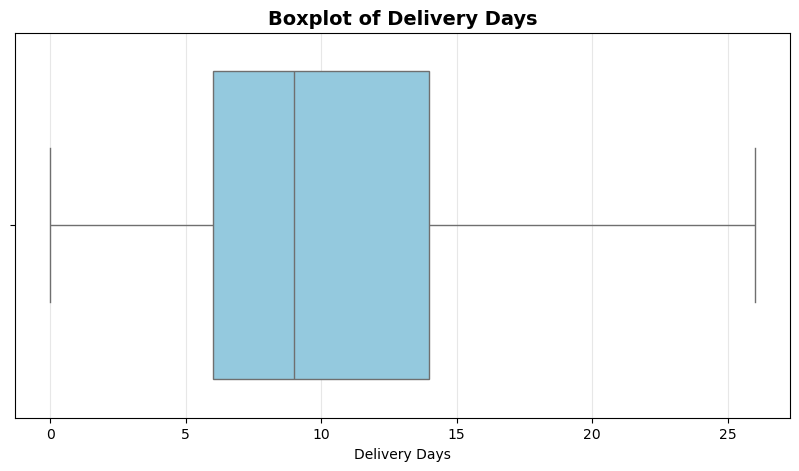

In [22]:
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(10, 5))
sns.boxplot(x='delivery_days', data=df, color='skyblue')
plt.title('Boxplot of Delivery Days', fontsize=14, fontweight='bold')
plt.xlabel('Delivery Days')
plt.grid(axis='x', alpha=0.3)
plt.show()

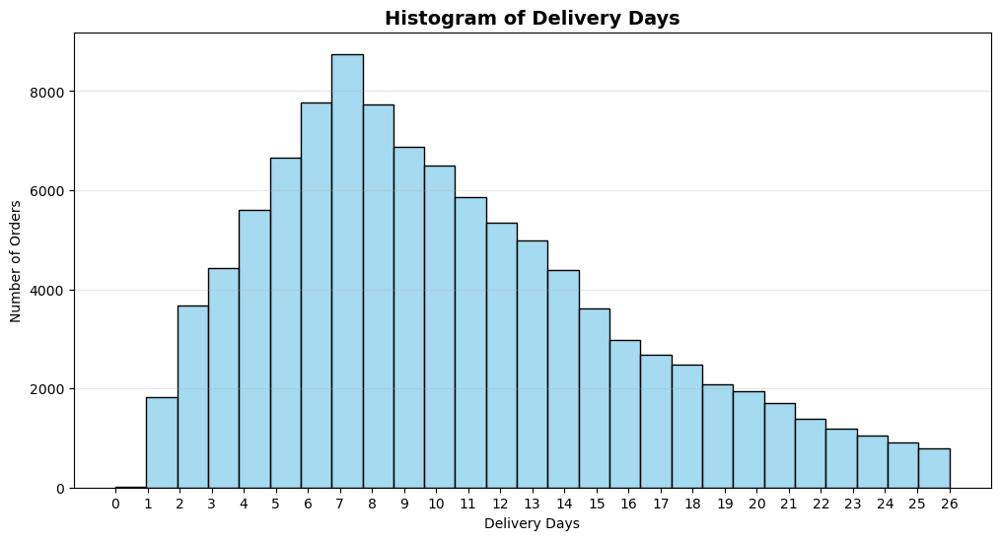

In [23]:
plt.figure(figsize=(12, 6))
sns.histplot(df['delivery_days'], bins=27, kde=False, color='skyblue')
plt.title('Histogram of Delivery Days', fontsize=14, fontweight='bold')
plt.xlabel('Delivery Days')
plt.ylabel('Number of Orders')
plt.xticks(range(0, 27, 1))
plt.grid(axis='y', alpha=0.3)
plt.show()

# 2.EDA

In [24]:
numeric_cols = df.select_dtypes(include=['int64', 'float64']).columns.tolist()

categorical_cols = df.select_dtypes(include=['object']).columns.tolist()

print("Numeric columns:", numeric_cols)
print("Categorical columns:", categorical_cols)

Numeric columns: ['order_item_id', 'price', 'freight_value', 'product_name_lenght', 'product_description_lenght', 'product_photos_qty', 'product_weight_g', 'product_length_cm', 'product_height_cm', 'product_width_cm', 'customer_zip_code_prefix', 'review_score', 'delivery_days', 'is_late', 'review_binary']
Categorical columns: ['order_id', 'customer_id', 'order_status', 'order_purchase_timestamp', 'order_approved_at', 'order_delivered_carrier_date', 'order_delivered_customer_date', 'order_estimated_delivery_date', 'product_id', 'seller_id', 'shipping_limit_date', 'product_category_name', 'customer_unique_id', 'customer_city', 'customer_state', 'review_id', 'review_comment_title', 'review_comment_message', 'review_creation_date', 'review_answer_timestamp']


In [25]:
id_cols = [
    'order_id', 'customer_id', 'product_id', 
    'seller_id', 'review_id'
]

df_eda = df.drop(columns=id_cols)

In [26]:
numeric_cols = [
    'price', 'freight_value',
    'product_name_lenght', 'product_description_lenght',
    'product_photos_qty', 'product_weight_g',
    'product_length_cm', 'product_height_cm', 'product_width_cm',
    'delivery_days'
]

categorical_cols = [col for col in df_eda.columns if col not in numeric_cols]

print("Numeric columns:", numeric_cols)
print("Categorical columns:", categorical_cols)

Numeric columns: ['price', 'freight_value', 'product_name_lenght', 'product_description_lenght', 'product_photos_qty', 'product_weight_g', 'product_length_cm', 'product_height_cm', 'product_width_cm', 'delivery_days']
Categorical columns: ['order_status', 'order_purchase_timestamp', 'order_approved_at', 'order_delivered_carrier_date', 'order_delivered_customer_date', 'order_estimated_delivery_date', 'order_item_id', 'shipping_limit_date', 'product_category_name', 'customer_unique_id', 'customer_zip_code_prefix', 'customer_city', 'customer_state', 'review_score', 'review_comment_title', 'review_comment_message', 'review_creation_date', 'review_answer_timestamp', 'is_late', 'review_binary']


In [27]:
df[numeric_cols].describe()

,price,freight_value,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,delivery_days
count,103186.000000,103186.000000,103186.000000,103186.000000,103186.000000,103186.000000,103186.000000,103186.000000,103186.000000,103186.000000
mean,117.879974,19.447235,48.152850,774.366019,2.184705,2032.829667,29.984814,16.374857,22.933867,10.291910
std,178.266205,14.951569,11.458521,652.199015,1.730539,3646.425700,15.977653,13.190803,11.628091,5.751327
min,0.850000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,39.900000,12.810000,42.000000,341.000000,1.000000,300.000000,18.000000,8.000000,15.000000,6.000000
50%,72.620000,16.110000,51.000000,594.000000,1.000000,675.000000,25.000000,13.000000,20.000000,9.000000
75%,129.990000,20.600000,57.000000,973.000000,3.000000,1750.000000,37.000000,20.000000,30.000000,14.000000
max,6735.000000,409.680000,76.000000,3992.000000,20.000000,40425.000000,105.000000,105.000000,118.000000,26.000000


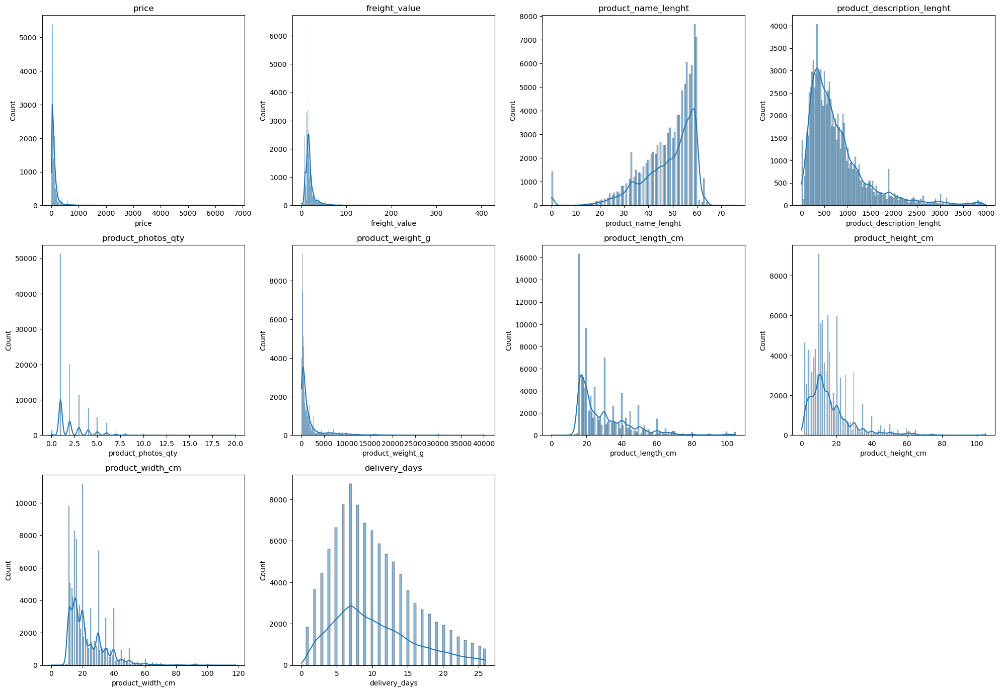

In [28]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(20, 18))
for i, col in enumerate(numeric_cols):
    plt.subplot(4, 4, i+1)
    sns.histplot(df[col], kde=True)
    plt.title(col)
plt.tight_layout()
plt.show()

* **price:**

lệch phải mạnh.

Đại đa số các sản phẩm có giá rất thấp, tập trung gần 0 (có lẽ dưới 500 hoặc 1000, tùy thuộc vào đơn vị).

Có một số lượng nhỏ sản phẩm có giá cao hơn, kéo dài đến khoảng 7000.

sản phẩm trong tập dữ liệu đều nằm ở phân khúc giá thấp.

* **freight_value:**

Tương tự như 'price'

* **product_name_lenght:**

phân phối gần với phân phối chuẩn hơn, nhưng có thể lệch trái nhẹ.

Độ dài tên sản phẩm phổ biến nhất nằm trong khoảng từ 50 đến 60 ký tự.

Độ dài tên sản phẩm ít phổ biến hơn có thể rất ngắn (gần 0) hoặc dài hơn (đến khoảng 70).

Tên sản phẩm trong tập dữ liệu có xu hướng có độ dài trung bình và tương đối đồng đều, với phần lớn rơi vào khoảng 50-60 ký tự.

* **product_description_lenght:**

lệch phải mạnh và có hình dạng dốc hơn.

đa số các mô tả sản phẩm có độ dài rất ngắn, tập trung mạnh mẽ gần 0.

Hầu hết các sản phẩm có mô tả ngắn gọn, nhưng một số ít sản phẩm có mô tả rất chi tiết và dài.

* **product_photos_qty:**

lệch phải rất mạnh.

các sản phẩm chỉ có một (1) ảnh, hoặc rất ít ảnh (khoảng 0 đến 5).

hiếm sản phẩm có nhiều hơn 10 ảnh, mặc dù có thể kéo dài đến 20.

người bán chỉ cung cấp số lượng ảnh tối thiểu cho sản phẩm của họ.

* **product_weight_g:**

lệch phải rất mạnh.

các sản phẩm có trọng lượng rất nhẹ, tập trung gần 0 (hoặc dưới 5000).

trọng lượng có thể kéo dài đến 40000, nhưng số lượng sản phẩm nặng là rất ít.

tập dữ liệu chủ yếu bao gồm các mặt hàng nhẹ.

* **product_length_cm:**

lệch phải mạnh.

Chiều dài sản phẩm phổ biến nhất nằm trong khoảng từ 10 đến 20. Có một đỉnh cao rõ rệt ở khoảng 10.

Chiều dài tối đa kéo dài đến khoảng 100.

Các sản phẩm thường có kích thước nhỏ gọn.

* **product_height_cm:**

lệch phải mạnh.

Tương tự chiều dài, chiều cao cũng tập trung ở mức thấp, với đỉnh phổ biến nhất có lẽ là dưới 10.

Chiều cao tối đa kéo dài đến khoảng 100.

Chiều cao của sản phẩm thường không quá cao.

* **product_width_cm:**

lệch phải mạnh.

Chiều rộng sản phẩm tập trung phổ biến nhất quanh 10 đến 20.

Chiều rộng tối đa kéo dài đến khoảng 120.

Cả ba kích thước (dài, rộng, cao) đều cho thấy sản phẩm chủ yếu là nhỏ và nhẹ, phù hợp với xu hướng trong các biểu đồ trước.

* **delivery_days:**

Phân phối gần chuẩn nhưng lệch phải nhẹ.

Số ngày giao hàng phổ biến nhất (trung bình) nằm trong khoảng từ 5 đến 15 ngày, với đỉnh phổ biến nhất có lẽ là khoảng 10 ngày.

Thời gian giao hàng kéo dài từ gần 0 đến khoảng 25-30 ngày.

Hầu hết các đơn hàng được giao trong khoảng 1-2 tuần.

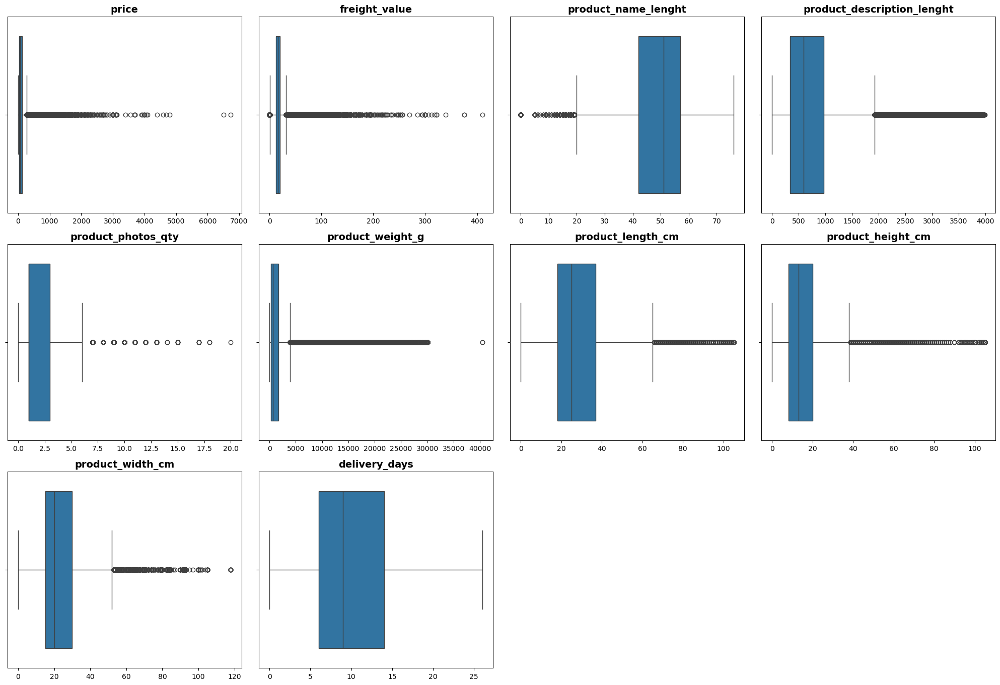

In [29]:
plt.figure(figsize=(20, 18))
for i, col in enumerate(numeric_cols):
    plt.subplot(4, 4, i+1)
    sns.boxplot(x=df[col])
    plt.title(col, fontsize=14, fontweight='bold')
    plt.xlabel("")
plt.tight_layout()
plt.show()

Tương tự như phân tích với biểu đồ histogram, với một số giá trị nằm ngoài râu của boxplot có thể hiểu được ý nghĩa như giá của một số sản phẩm có thể sẽ mắc; phí vận chuyển có thể sẽ cao (cần xét nhiều yếu tố); những đặc trưng về sản phẩm như dài, rộng cao,... sẽ có nhiều mặc hàng nặng vì đây là dữ liệu về sàn thương mại điện tử có thể sẽ có nhiều mặc hàng như nội thất, thiết bị...

In [30]:
for col in numeric_cols:
    print(f"{col}: skew={df[col].skew():.2f}, kurtosis={df[col].kurt():.2f}")

price: skew=8.00, kurtosis=121.38
freight_value: skew=5.65, kurtosis=62.67
product_name_lenght: skew=-1.50, kurtosis=3.02
product_description_lenght: skew=1.98, kurtosis=4.85
product_photos_qty: skew=1.85, kurtosis=4.49
product_weight_g: skew=3.64, kurtosis=16.75
product_length_cm: skew=1.76, kurtosis=3.79
product_height_cm: skew=2.27, kurtosis=7.63
product_width_cm: skew=1.71, kurtosis=4.64
delivery_days: skew=0.67, kurtosis=-0.18


**ĐỘ LỆCH:**
$$\text{Skewness} = \frac{\frac{1}{n}\sum_{i=1}^{n} (x_i - \bar{x})^3}{\left(\frac{1}{n}\sum_{i=1}^{n} (x_i - \bar{x})^2\right)^{3/2}}$$

**Độ nhọn (Kurtosis):**
$$
\text{Kurtosis} = \frac{\frac{1}{n} \sum_{i=1}^{n} (x_i - \bar{x})^4}{\left(\frac{1}{n} \sum_{i=1}^{n} (x_i - \bar{x})^2 \right)^2} - 3
$$

1. Price

Skew = 8.0 → lệch phải rất mạnh (đa số sản phẩm giá thấp, một số cực cao kéo dài đuôi phải).

Kurtosis = 121.38 → rất nhọn, dữ liệu tập trung cực kỳ vào các giá trị phổ biến (thường là giá thấp), nhưng có một số giá trị ngoại lai cực cao.

→ Phân phối rất lệch và có outlier mạnh.

2. Freight_value

Skew = 5.65 → lệch phải mạnh, hầu hết đơn vận chuyển có giá thấp.

Kurtosis = 62.67 → nhọn, tập trung nhiều vào giá vận chuyển phổ biến.

3. Product_name_lenght

Skew = -1.50 → lệch trái, nghĩa là nhiều tên sản phẩm dài hơn trung bình, ít tên ngắn.

Kurtosis = 3.02 → nhọn vừa phải, phân phối có độ tập trung tương đối.

4. Product_description_lenght

Skew = 1.98 → lệch phải vừa phải, nhiều mô tả ngắn, ít mô tả dài.

Kurtosis = 4.85 → nhọn hơn chuẩn, nhưng không quá cực đoan.

5. Product_photos_qty

Skew = 1.85 → lệch phải, đa số sản phẩm có 1–3 ảnh, ít sản phẩm nhiều ảnh.

Kurtosis = 4.49 → nhọn vừa, tập trung quanh giá trị phổ biến.

6. Product_weight_g

Skew = 3.64 → lệch phải mạnh, hầu hết sản phẩm nhẹ, một số cực nặng kéo dài đuôi phải.

Kurtosis = 16.75 → nhọn, nhiều giá trị tập trung gần trọng lượng thấp.

7. Product_length_cm / height / width

Skew ~ 1.7–2.3 → lệch phải vừa phải đến mạnh, đa số sản phẩm nhỏ/nhỏ vừa.

Kurtosis ~ 3.7–7.6 → nhọn hơn phân phối chuẩn, tập trung vào các kích thước phổ biến.

8. Delivery_days

Skew = 0.67 → lệch phải nhẹ, hầu hết đơn hàng giao nhanh, vài đơn lâu kéo đuôi phải.

Kurtosis = -0.18 → gần phân phối chuẩn, hơi dẹt, dữ liệu trải rộng hơn chuẩn.

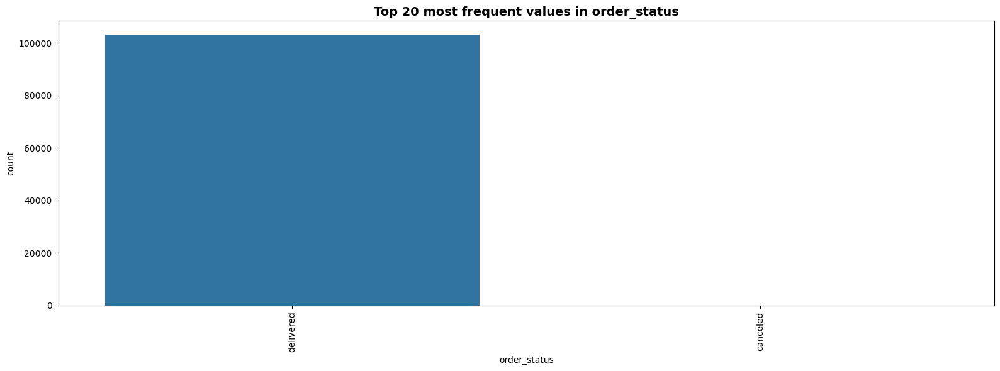

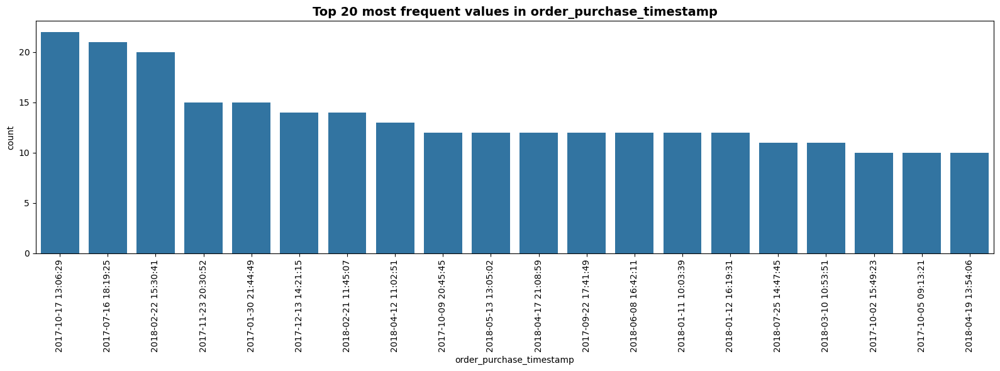

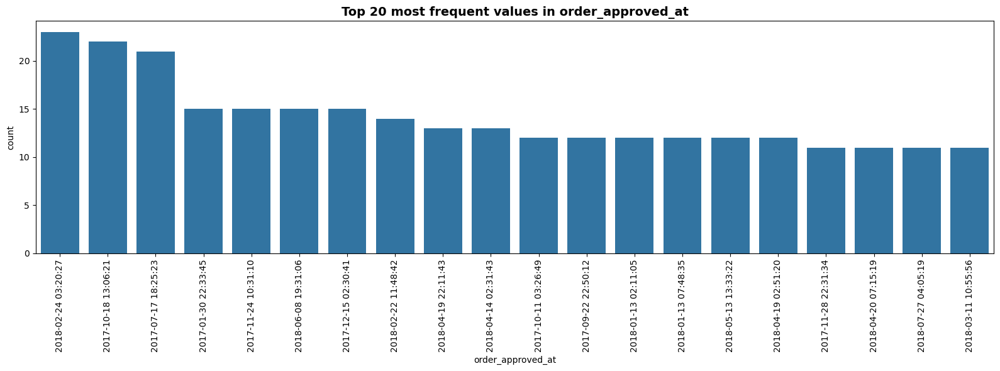

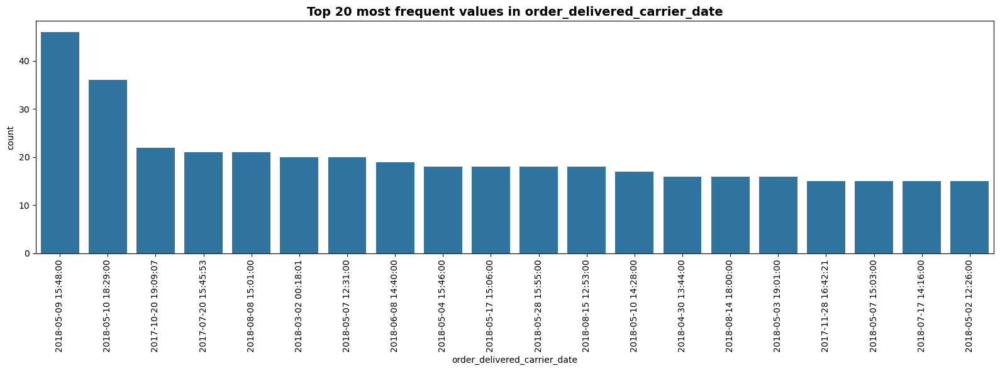

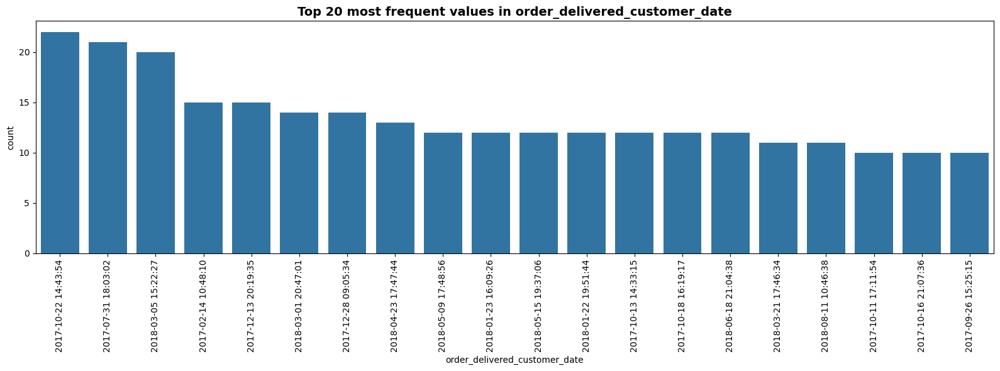

...

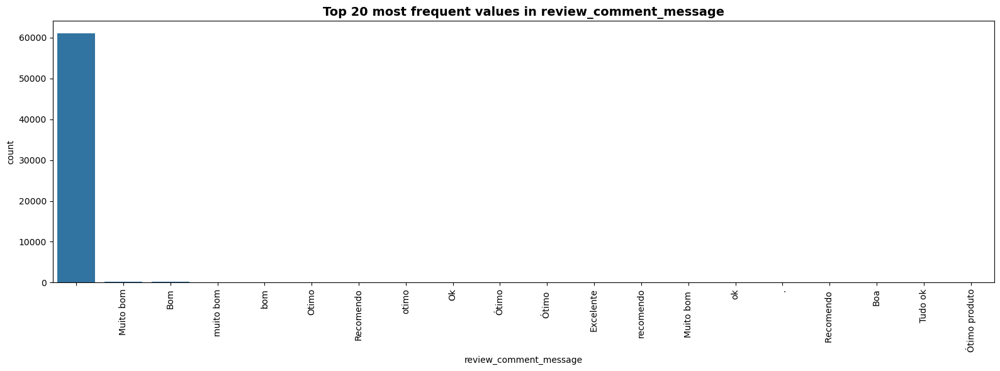

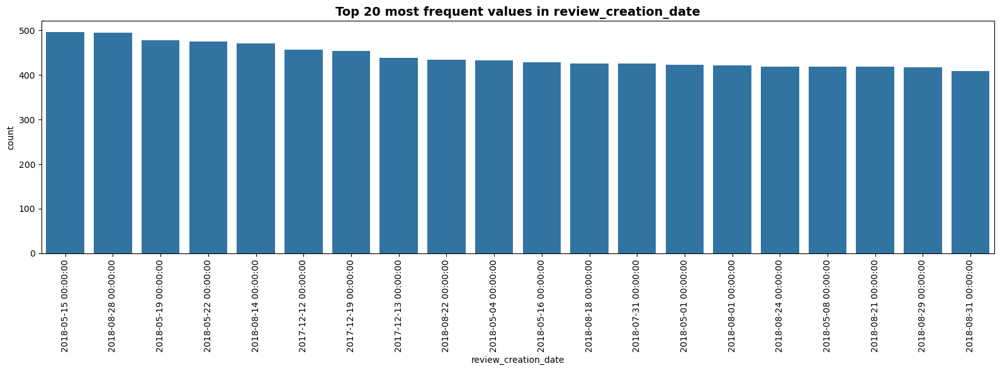

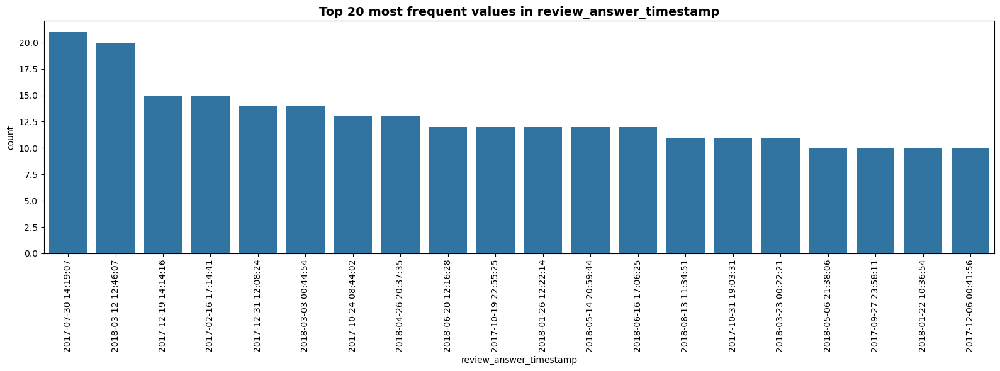

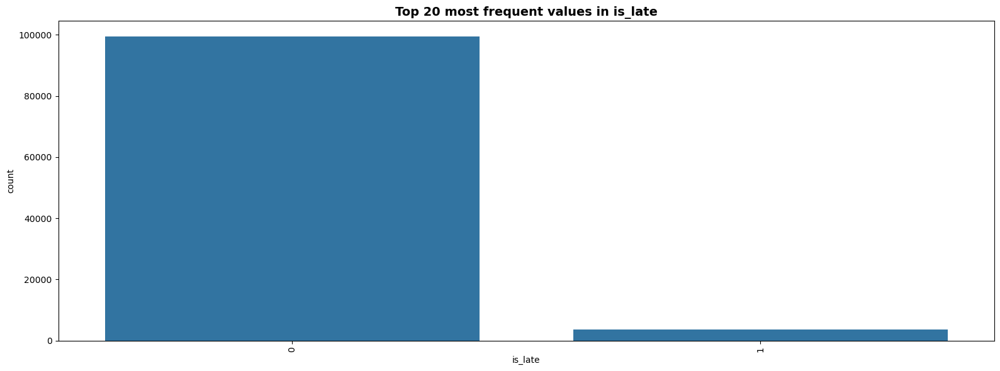

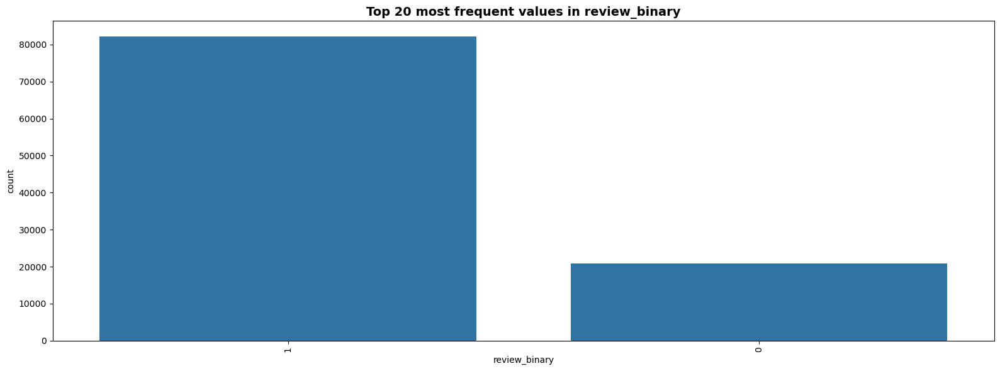

In [31]:
for col in categorical_cols:
    plt.figure(figsize=(16, 6))
    top20 = df[col].value_counts().head(20).index
    sns.countplot(
        data=df[df[col].isin(top20)],
        x=col,
        order=top20
    )
    plt.title(f"Top 20 most frequent values in {col}", fontsize=14, fontweight='bold')
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()

Phần biểu đồ countplot chỉ hiển thị top 20 tần suất xuất hiện nhiều nhất:

Nhìn chung các khoảng thời gian của những cột 'order_purchase_timestamp', 'order_approved_at', 'order_delivered_carrier_date', 'order_delivered_customer_date', 'order_estimated_delivery_date', review_creation_date', 'review_answer_timestamp', 'shipping_limit_date' đều phân bố như nhau 

'order_item_id' biểu hiện cho thứ tự trong đơn, thường tập trung mua 1 mặc hàng hoặc có thể trong 1 hóa đơn có nhiều mặc hàng

'product_category_name' tập trung nhiều vào sản phẩm giường, nhà tắm, những sản phẩm còn lại tập trung đều

'customer_unique_id' có nhiều khách hàng mua lại sản phẩm có thể phân tích tệp khách hàng hay khách hàng sau khi mua lần 1 có quay lại nhiều lần nữa không

'customer_zip_code_prefix' tượng trưng cho mã tra cứu bảng vị trí nên sẽ phân tích thông qua "customer_city" tập trung nhiều ở thành phố sao paulo

'review_score' tập trung nhiều vào đánh giá cao(5.0) có thể sẽ có bias

'review_comment_title' & 'review_comment_message' thường nhiều nhất là không để lại đánh giá hay hồi đáp lại giữa người bán và người mua

'Is_late' giao sớm hơn là giao muộn

'review_binary' những sản phẩm được đánh giá tốt hơn là không tốt

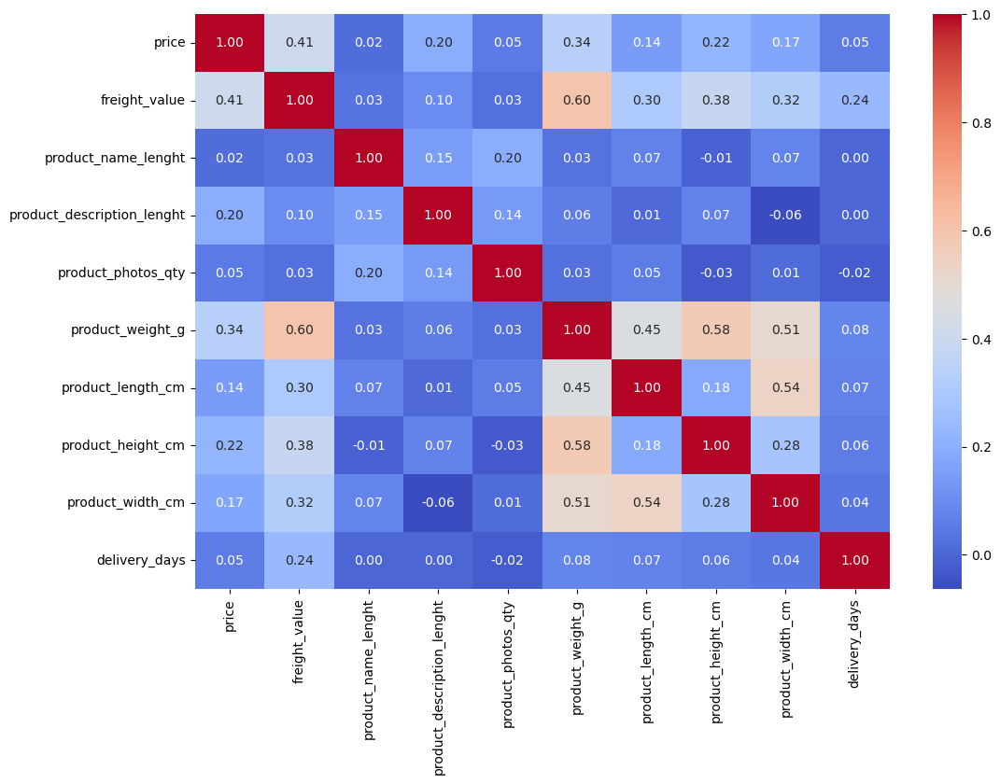

In [32]:
corr = df[numeric_cols].corr()

plt.figure(figsize=(12,8))
sns.heatmap(corr, annot=True, fmt=".2f", cmap="coolwarm")
plt.show()

1. Tương quan với Price

freight_value -> $0.41$ -> Tương quan dương vừa phải. Hàng hóa có giá cao hơn có xu hướng có chi phí vận chuyển cao hơn. (Điều này có thể do kích thước/trọng lượng lớn hơn hoặc giá trị bảo hiểm cao hơn).

product_weight_g -> $0.34$ -> Tương quan dương yếu đến vừa phải. Sản phẩm nặng hơn có xu hướng có giá cao hơn.

product_length_cm -> $0.30$ -> Tương quan dương yếu. Tương tự, sản phẩm dài hơn có giá cao hơn một chút.

product_height_cm -> $0.22$ -> Tương quan dương yếu.

product_width_cm -> $0.17$ -> Tương quan dương yếu.

delivery_days -> $0.05$ -> Tương quan rất yếu. Giá bán gần như không ảnh hưởng đến thời gian giao hàng, hoặc ngược lại.

2. Các cặp tương quan

product_weight_g & product_length_cm -> $0.60$ -> Tương quan dương mạnh. Sản phẩm nặng hơn có xu hướng dài hơn.

product_weight_g & product_height_cm -> $0.58$ -> Tương quan dương mạnh. Sản phẩm nặng hơn có xu hướng cao hơn.

product_weight_g & product_width_cm -> $0.51$ -> Tương quan dương vừa phải. Sản phẩm nặng hơn có xu hướng rộng hơn.

product_length_cm & product_width_cm -> $0.54$ -> Tương quan dương vừa phải.

3. Tương quan với freight_value

product_weight_g -> $0.60$ -> Tương quan dương mạnh. Trọng lượng là yếu tố quan trọng nhất ảnh hưởng đến chi phí vận chuyển.

product_height_cm -> $0.38$ -> Tương quan dương vừa phải.

product_length_cm ->$0.30$ -> Tương quan dương yếu.

* Dự đoán giá có thể chọn các đặc trưng: freight_value, product_weight_g, product_length_cm, product_height_cm và product_width_cm

* Phân tích trọng lượng / kích thước sản phẩm: product_weight_g, product_length_cm, product_height_cm, product_width_cm

* Dự đoán freight_value: product_weight_g, product_height_cm, product_length_cm

In [33]:
df['review_group'] = pd.cut(df['review_score'], 
                                bins=[0, 2, 3, 5], 
                                labels=['Low (1-2)', 'Medium (3)', 'High (4-5)'])

C:\Users\biena\AppData\Local\Temp\ipykernel_7096\3465279796.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['review_group'] = pd.cut(df['review_score'],


In [34]:
df

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,order_item_id,product_id,...,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,delivery_days,is_late,review_binary,review_group
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,1.0,87285b34884572647811a353c7ac498a,...,a54f0611adc9ed256b57ede6b6eb5114,4.0,,"Não testei o produto ainda, mas ele veio corre...",2017-10-11 00:00:00,2017-10-12 03:43:48,8,0,1,High (4-5)
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,1.0,595fac2a385ac33a80bd5114aec74eb8,...,8d5266042046a06655c8db133d120ba5,4.0,Muito boa a loja,Muito bom o produto.,2018-08-08 00:00:00,2018-08-08 18:37:50,13,0,1,High (4-5)
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,1.0,aa4383b373c6aca5d8797843e5594415,...,e73b67b67587f7644d5bd1a52deb1b01,5.0,,,2018-08-18 00:00:00,2018-08-22 19:07:58,9,0,1,High (4-5)
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,1.0,d0b61bfb1de832b15ba9d266ca96e5b0,...,359d03e676b3c069f62cadba8dd3f6e8,5.0,,O produto foi exatamente o que eu esperava e e...,2017-12-03 00:00:00,2017-12-05 19:21:58,13,0,1,High (4-5)
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26,1.0,65266b2da20d04dbe00c5c2d3bb7859e,...,e50934924e227544ba8246aeb3770dd4,5.0,,,2018-02-17 00:00:00,2018-02-18 13:02:51,2,0,1,High (4-5)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
109991,63943bddc261676b46f01ca7ac2f7bd8,1fca14ff2861355f6e5f14306ff977a7,delivered,2018-02-06 12:58:58,2018-02-06 13:10:37,2018-02-07 23:22:42,2018-02-28 17:37:56,2018-03-02,1.0,f1d4ce8c6dd66c47bbaa8c6781c2a923,...,29bb71b2760d0f876dfa178a76bc4734,4.0,,So uma peça que veio rachado mas tudo bem rs,2018-03-01 00:00:00,2018-03-02 17:50:01,22,0,1,High (4-5)
109992,83c1379a015df1e13d02aae0204711ab,1aa71eb042121263aafbe80c1b562c9c,delivered,2017-08-27 14:46:43,2017-08-27 15:04:16,2017-08-28 20:52:26,2017-09-21 11:24:17,2017-09-27,1.0,b80910977a37536adeddd63663f916ad,...,371579771219f6db2d830d50805977bb,5.0,,Foi entregue antes do prazo.,2017-09-22 00:00:00,2017-09-22 23:10:57,24,0,1,High (4-5)
109993,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,delivered,2018-01-08 21:28:27,2018-01-08 21:36:21,2018-01-12 15:35:03,2018-01-25 23:32:54,2018-02-15,1.0,d1c427060a0f73f6b889a5c7c61f2ac4,...,8ab6855b9fe9b812cd03a480a25058a1,2.0,,Foi entregue somente 1. Quero saber do outro p...,2018-01-26 00:00:00,2018-01-27 09:16:56,17,0,0,Low (1-2)
109994,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,delivered,2018-01-08 21:28:27,2018-01-08 21:36:21,2018-01-12 15:35:03,2018-01-25 23:32:54,2018-02-15,2.0,d1c427060a0f73f6b889a5c7c61f2ac4,...,8ab6855b9fe9b812cd03a480a25058a1,2.0,,Foi entregue somente 1. Quero saber do outro p...,2018-01-26 00:00:00,2018-01-27 09:16:56,17,0,0,Low (1-2)


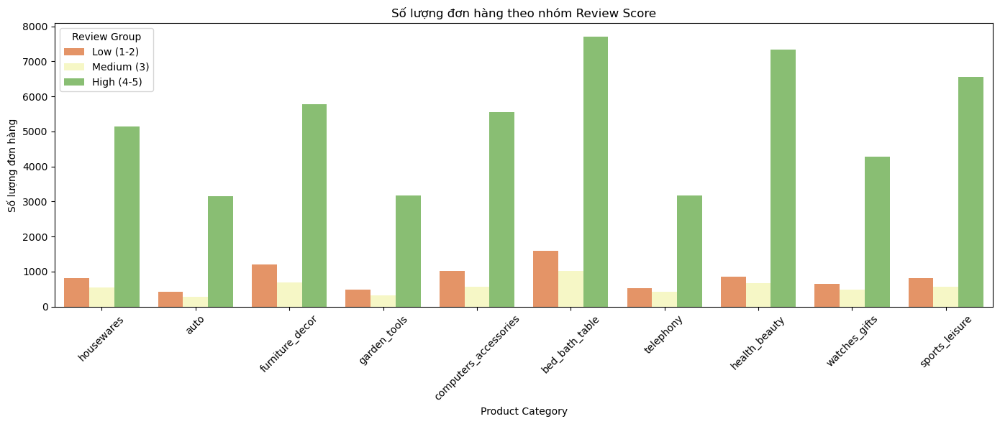

In [35]:
top_categories = df['product_category_name'].value_counts().head(10).index
df_top = df[df['product_category_name'].isin(top_categories)]

# Vẽ grouped bar chart
plt.figure(figsize=(14,6))
sns.countplot(data=df_top, x='product_category_name', hue='review_group', palette='RdYlGn')

plt.xticks(rotation=45)
plt.xlabel('Product Category')
plt.ylabel('Số lượng đơn hàng')
plt.title('Số lượng đơn hàng theo nhóm Review Score')
plt.legend(title='Review Group')
plt.tight_layout()
plt.show()

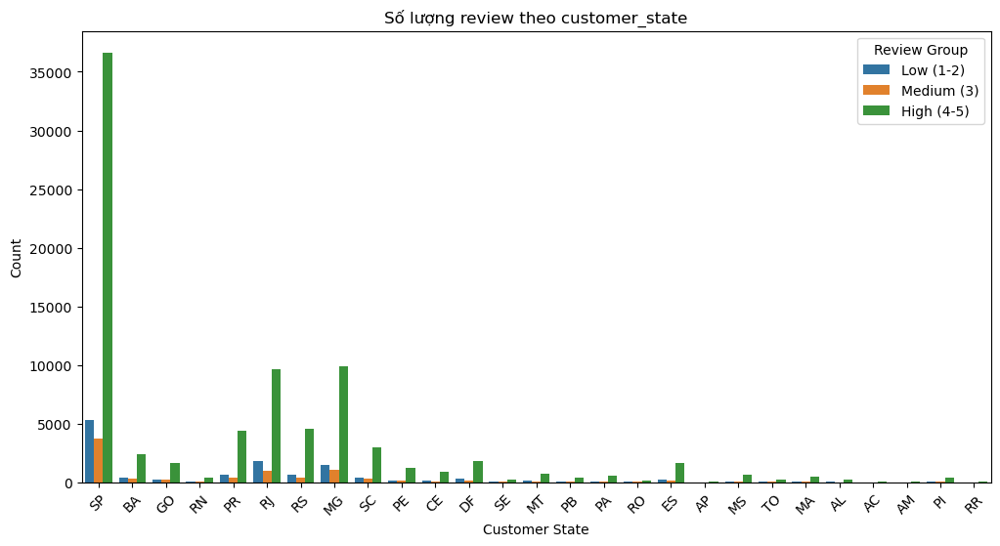

In [36]:
plt.figure(figsize=(12,6))
sns.countplot(x='customer_state', hue='review_group', data=df)
plt.title('Số lượng review theo customer_state')
plt.xlabel('Customer State')
plt.ylabel('Count')
plt.legend(title='Review Group')
plt.xticks(rotation=45)
plt.show()

In [37]:
def categorize_delivery(days):
    if days < 5:
        return 'Early'
    elif days <= 10:
        return 'On Time'
    else:
        return 'Late'


df['delivery_group'] = df['delivery_days'].apply(categorize_delivery)
df

C:\Users\biena\AppData\Local\Temp\ipykernel_7096\3878488174.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['delivery_group'] = df['delivery_days'].apply(categorize_delivery)


,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,order_item_id,product_id,...,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,delivery_days,is_late,review_binary,review_group,delivery_group
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,1.0,87285b34884572647811a353c7ac498a,...,4.0,,"Não testei o produto ainda, mas ele veio corre...",2017-10-11 00:00:00,2017-10-12 03:43:48,8,0,1,High (4-5),On Time
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,1.0,595fac2a385ac33a80bd5114aec74eb8,...,4.0,Muito boa a loja,Muito bom o produto.,2018-08-08 00:00:00,2018-08-08 18:37:50,13,0,1,High (4-5),Late
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,1.0,aa4383b373c6aca5d8797843e5594415,...,5.0,,,2018-08-18 00:00:00,2018-08-22 19:07:58,9,0,1,High (4-5),On Time
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,1.0,d0b61bfb1de832b15ba9d266ca96e5b0,...,5.0,,O produto foi exatamente o que eu esperava e e...,2017-12-03 00:00:00,2017-12-05 19:21:58,13,0,1,High (4-5),Late
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26,1.0,65266b2da20d04dbe00c5c2d3bb7859e,...,5.0,,,2018-02-17 00:00:00,2018-02-18 13:02:51,2,0,1,High (4-5),Early
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
109991,63943bddc261676b46f01ca7ac2f7bd8,1fca14ff2861355f6e5f14306ff977a7,delivered,2018-02-06 12:58:58,2018-02-06 13:10:37,2018-02-07 23:22:42,2018-02-28 17:37:56,2018-03-02,1.0,f1d4ce8c6dd66c47bbaa8c6781c2a923,...,4.0,,So uma peça que veio rachado mas tudo bem rs,2018-03-01 00:00:00,2018-03-02 17:50:01,22,0,1,High (4-5),Late
109992,83c1379a015df1e13d02aae0204711ab,1aa71eb042121263aafbe80c1b562c9c,delivered,2017-08-27 14:46:43,2017-08-27 15:04:16,2017-08-28 20:52:26,2017-09-21 11:24:17,2017-09-27,1.0,b80910977a37536adeddd63663f916ad,...,5.0,,Foi entregue antes do prazo.,2017-09-22 00:00:00,2017-09-22 23:10:57,24,0,1,High (4-5),Late
109993,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,delivered,2018-01-08 21:28:27,2018-01-08 21:36:21,2018-01-12 15:35:03,2018-01-25 23:32:54,2018-02-15,1.0,d1c427060a0f73f6b889a5c7c61f2ac4,...,2.0,,Foi entregue somente 1. Quero saber do outro p...,2018-01-26 00:00:00,2018-01-27 09:16:56,17,0,0,Low (1-2),Late
109994,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,delivered,2018-01-08 21:28:27,2018-01-08 21:36:21,2018-01-12 15:35:03,2018-01-25 23:32:54,2018-02-15,2.0,d1c427060a0f73f6b889a5c7c61f2ac4,...,2.0,,Foi entregue somente 1. Quero saber do outro p...,2018-01-26 00:00:00,2018-01-27 09:16:56,17,0,0,Low (1-2),Late


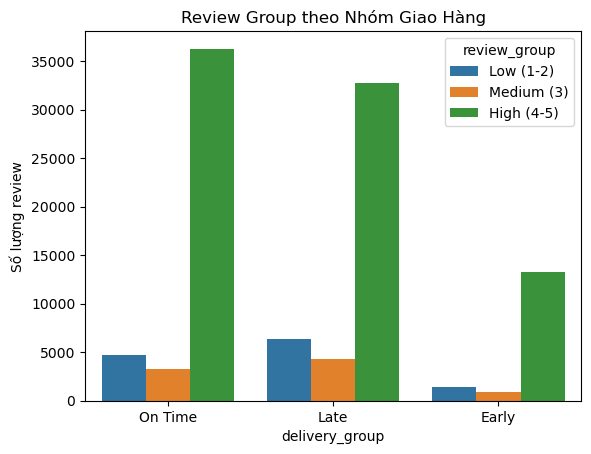

In [38]:
sns.countplot(x='delivery_group', hue='review_group', data=df)
plt.title('Review Group theo Nhóm Giao Hàng')
plt.ylabel('Số lượng review')
plt.show()

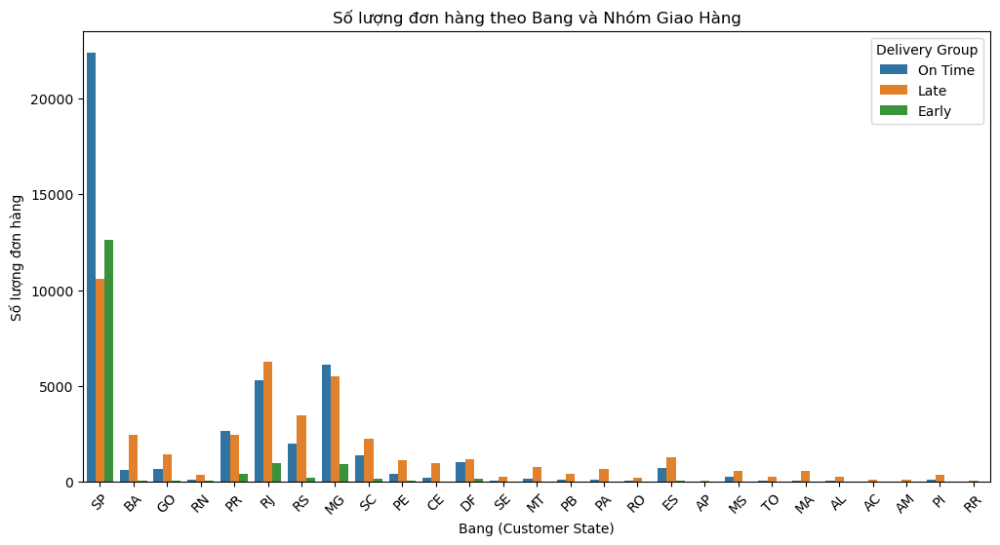

In [39]:
plt.figure(figsize=(12,6))
sns.countplot(x='customer_state', hue='delivery_group', data=df)
plt.title('Số lượng đơn hàng theo Bang và Nhóm Giao Hàng')
plt.xlabel('Bang (Customer State)')
plt.ylabel('Số lượng đơn hàng')
plt.xticks(rotation=45)
plt.legend(title='Delivery Group')
plt.show()

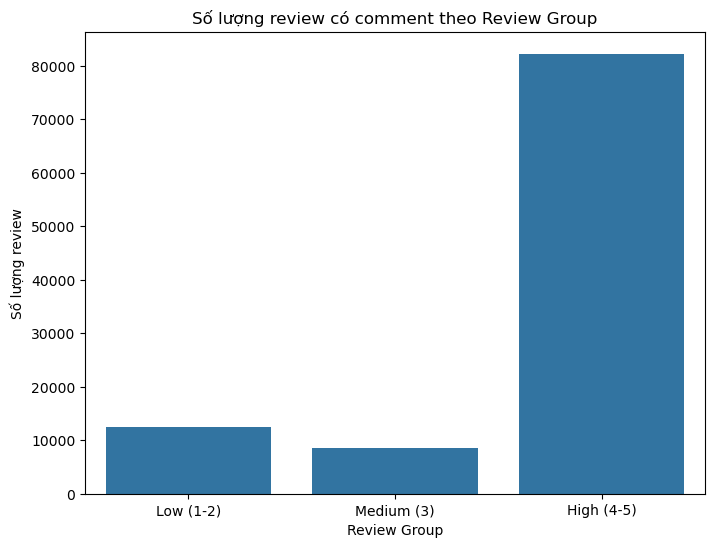

In [40]:
plt.figure(figsize=(8,6))
sns.countplot(x='review_group', 
              data=df[['review_comment_message', 'review_group']],  
              order=['Low (1-2)','Medium (3)','High (4-5)'])
plt.title('Số lượng review có comment theo Review Group')
plt.xlabel('Review Group')
plt.ylabel('Số lượng review')
plt.show()

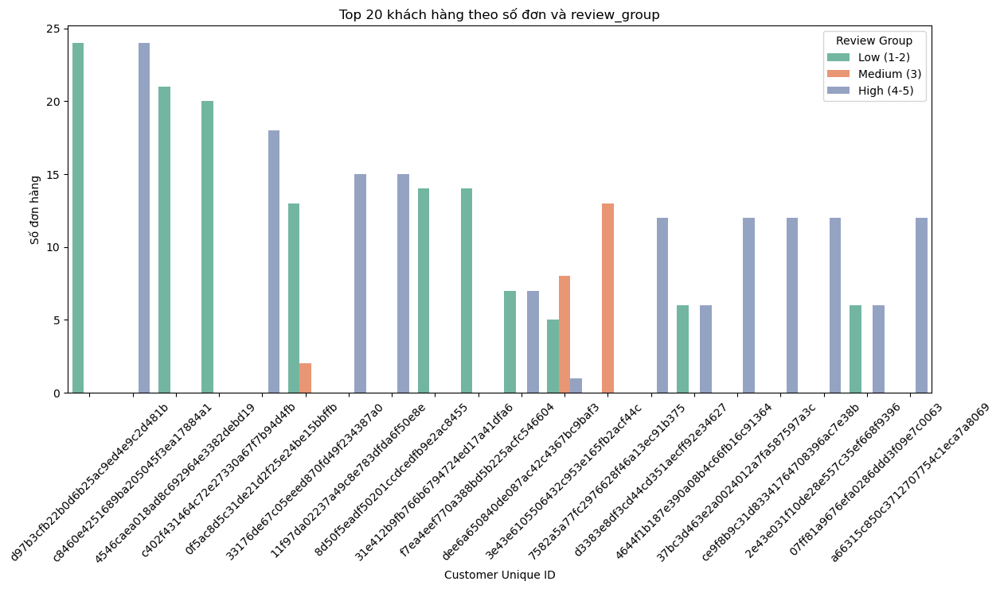

In [41]:
top_customers = df['customer_unique_id'].value_counts().nlargest(20).index
df_top = df[df['customer_unique_id'].isin(top_customers)]

plt.figure(figsize=(14,6))
sns.countplot(
    x='customer_unique_id',
    hue='review_group',   # phân loại theo review_group
    data=df_top,
    order=top_customers,
    palette='Set2'
)
plt.xticks(rotation=45)
plt.title('Top 20 khách hàng theo số đơn và review_group')
plt.xlabel('Customer Unique ID')
plt.ylabel('Số đơn hàng')
plt.legend(title='Review Group')
plt.show()

# 3. HUẤN LUYỆN MÔ HÌNH

## 3.1. Phân loại khách hàng

In [42]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 103186 entries, 0 to 109995
Data columns (total 37 columns):
 #   Column                         Non-Null Count   Dtype   
---  ------                         --------------   -----   
 0   order_id                       103186 non-null  object  
 1   customer_id                    103186 non-null  object  
 2   order_status                   103186 non-null  object  
 3   order_purchase_timestamp       103186 non-null  object  
 4   order_approved_at              103186 non-null  object  
 5   order_delivered_carrier_date   103186 non-null  object  
 6   order_delivered_customer_date  103186 non-null  object  
 7   order_estimated_delivery_date  103186 non-null  object  
 8   order_item_id                  103186 non-null  float64 
 9   product_id                     103186 non-null  object  
 10  seller_id                      103186 non-null  object  
 11  shipping_limit_date            103186 non-null  object  
 12  price                

C:\Users\biena\AppData\Local\Temp\ipykernel_7096\1374159194.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['order_purchase_timestamp'] = pd.to_datetime(df['order_purchase_timestamp'], errors='coerce')
C:\Users\biena\AppData\Local\Temp\ipykernel_7096\1374159194.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['total_value'] = df['price'] + df['freight_value']


Snapshot Date: 2018-08-30 15:00:37

--- Kết quả RFM ---


,customer_unique_id,Recency,Frequency,Monetary
0,0000366f3b9a7992bf8c76cfdf3221e2,112,1,141.90
1,0000b849f77a49e4a4ce2b2a4ca5be3f,115,1,27.19
2,0000f46a3911fa3c0805444483337064,537,1,86.22
3,0000f6ccb0745a6a4b88665a16c9f078,321,1,43.62
4,0004aac84e0df4da2b147fca70cf8255,288,1,196.89



--- Thống kê mô tả ---
            Recency     Frequency      Monetary
count  86887.000000  86887.000000  86887.000000
mean     237.196830      1.032226    163.088210
std      154.456257      0.205515    224.216914
min        1.000000      1.000000      9.590000
25%      111.000000      1.000000     62.280000
50%      219.000000      1.000000    106.680000
75%      350.000000      1.000000    179.840000
max      695.000000     15.000000  13664.080000


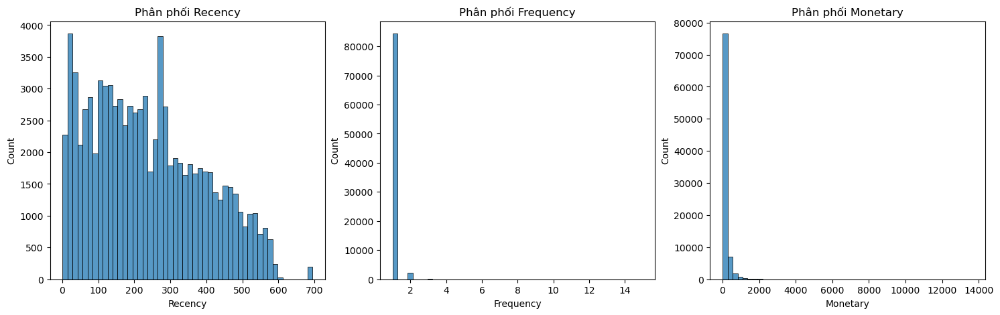


Đã hoàn thành Feature Engineering.


In [43]:
import datetime as dt
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# --- Xử lý datetime ---
df['order_purchase_timestamp'] = pd.to_datetime(df['order_purchase_timestamp'], errors='coerce')

# --- Tạo total_value (price + freight) ---
df['total_value'] = df['price'] + df['freight_value']

# --- Snapshot Date ---
max_date = df['order_purchase_timestamp'].max() + dt.timedelta(days=1)
print("Snapshot Date:", max_date)

# --- Tính Recency ---
df_recency = df.groupby('customer_unique_id')['order_purchase_timestamp'] \
               .max() \
               .apply(lambda x: (max_date - x).days) \
               .rename("Recency")

# --- Tính Frequency ---
df_frequency = df.groupby('customer_unique_id')['order_id'] \
                 .nunique() \
                 .rename("Frequency")

# --- Tính Monetary ---
df_monetary = df.groupby('customer_unique_id')['total_value'] \
                .sum() \
                .rename("Monetary")

# --- Gom 3 phần tạo RFM ---
rfm_df = pd.concat([df_recency, df_frequency, df_monetary], axis=1).reset_index()

# --- Loại khách chi tiêu <= 0 ---
rfm_df = rfm_df[rfm_df['Monetary'] > 0]

# --- Hiển thị ---
print("\n--- Kết quả RFM ---")
display(rfm_df.head())
print("\n--- Thống kê mô tả ---")
print(rfm_df.describe())

# --- Histogram ---
fig, ax = plt.subplots(1, 3, figsize=(18, 5))
sns.histplot(rfm_df['Recency'], bins=50, ax=ax[0]).set_title('Phân phối Recency')
sns.histplot(rfm_df['Frequency'], bins=50, ax=ax[1]).set_title('Phân phối Frequency')
sns.histplot(rfm_df['Monetary'], bins=50, ax=ax[2]).set_title('Phân phối Monetary')
plt.show()

# --- Xuất CSV ---
rfm_df.to_csv("rfm_data.csv", index=False)
print("\nĐã hoàn thành Feature Engineering.")

In [44]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Cấu hình hiển thị 3D
from mpl_toolkits.mplot3d import Axes3D

# Đọc dữ liệu RFM
try:
    rfm_df = pd.read_csv('rfm_data.csv')
    print("Đã đọc dữ liệu RFM thành công!")
    
    # Xử lý phân phối lệch (Skewness Handling)
    # Dữ liệu tài chính thường bị lệch phải (Right-skewed). Ta dùng Log Transform để làm mượt dữ liệu.
    # Cộng thêm 1 để tránh lỗi log(0)
    rfm_log = np.log(rfm_df[['Recency', 'Frequency', 'Monetary']] + 1)
    
    # 3. Chuẩn hóa dữ liệu (Standardization)
    # Đưa về dạng phân phối chuẩn (Mean = 0, Std = 1)
    scaler = StandardScaler()
    rfm_scaled = scaler.fit_transform(rfm_log)
    
    # Tạo DataFrame hiển thị thử kết quả sau chuẩn hóa
    rfm_scaled_df = pd.DataFrame(rfm_scaled, columns=['Recency', 'Frequency', 'Monetary'])
    
    print("\nDữ liệu sau khi chuẩn hóa:")
    display(rfm_scaled_df.head(6))

except FileNotFoundError:
    print("Lỗi: Không tìm thấy file 'rfm_data.csv'.")

Đã đọc dữ liệu RFM thành công!

Dữ liệu sau khi chuẩn hóa:


,Recency,Frequency,Monetary
0,-0.442801,-0.167119,0.303934
1,-0.415330,-0.167119,-1.706003
2,1.193203,-0.167119,-0.307415
3,0.655050,-0.167119,-1.137369
4,0.541692,-0.167119,0.707074
5,-0.167023,-0.167119,0.504163


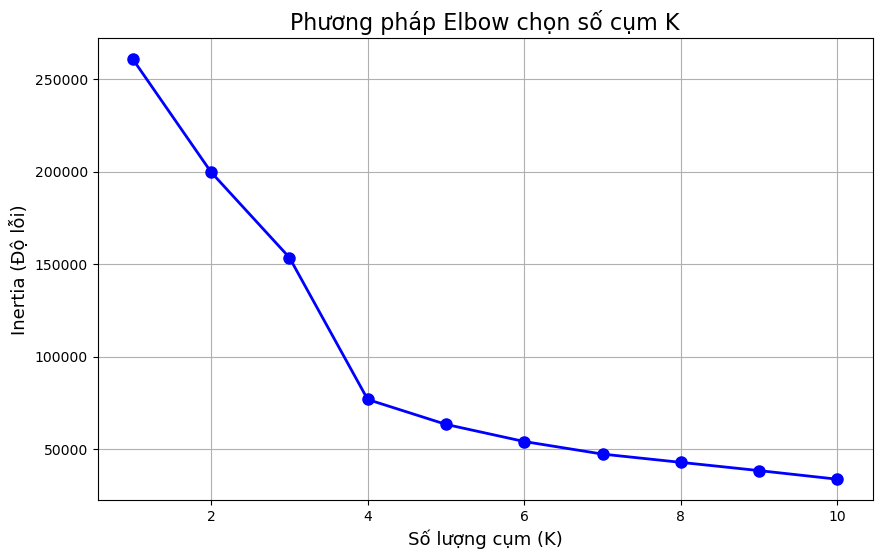

In [45]:
inertia = []
K_range = range(1, 11) # Thử nghiệm từ 1 đến 10 cụm

# Chạy vòng lặp để tính Inertia cho từng K
for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(rfm_scaled)
    inertia.append(kmeans.inertia_) # Lưu lại giá trị SSE

# Vẽ biểu đồ Elbow
plt.figure(figsize=(10, 6))
plt.plot(K_range, inertia, 'bo-', markersize=8, linewidth=2)
plt.xlabel('Số lượng cụm (K)', fontsize=13)
plt.ylabel('Inertia (Độ lỗi)', fontsize=13)
plt.title('Phương pháp Elbow chọn số cụm K', fontsize=16)
plt.grid(True)
plt.show()

In [46]:
# Khởi tạo và huấn luyện mô hình với K=4
k_final = 4
kmeans_model = KMeans(n_clusters=k_final, random_state=42)
kmeans_model.fit(rfm_scaled)

# Gán nhãn cụm (Cluster Label) vào dữ liệu gốc
rfm_df['Cluster'] = kmeans_model.labels_

# Tính toán Silhouette Score
score = silhouette_score(rfm_scaled, kmeans_model.labels_)
print(f"Silhouette Score với K = {k_final}: {score:.3f}")

# Phân tích đặc điểm từng cụm (Profile Analysis)
# Tính giá trị trung bình của R, F, M cho từng nhóm để hiểu đặc điểm
cluster_summary = rfm_df.groupby('Cluster').agg({
    'Recency': 'mean',
    'Frequency': 'mean',
    'Monetary': 'mean',
    'customer_unique_id': 'count' # Đếm số lượng khách
}).reset_index()

cluster_summary.columns = ['Cluster', 'Avg_Recency (Ngày)', 'Avg_Frequency (Đơn)', 'Avg_Monetary (Tiền)', 'Count (Số lượng khách)']
display(cluster_summary.round(2))

Silhouette Score với K = 4: 0.395


,Cluster,Avg_Recency (Ngày),Avg_Frequency (Đơn),Avg_Monetary (Tiền),Count (Số lượng khách)
0,0,289.01,1.00,67.21,38994
1,1,41.71,1.00,132.42,15723
2,2,274.06,1.00,291.56,29655
3,3,221.24,2.11,326.48,2515



--- KẾT QUẢ PHÂN KHÚC KHÁCH HÀNG ---


,Cluster,Segment_Name,Recency,Frequency,Monetary
0,2,Khách hàng mới (Tiềm năng),112,1,141.90
1,0,Khách hàng vãng lai (Rời bỏ),115,1,27.19
2,0,Khách hàng vãng lai (Rời bỏ),537,1,86.22
3,0,Khách hàng vãng lai (Rời bỏ),321,1,43.62
4,2,Khách hàng mới (Tiềm năng),288,1,196.89


,Phân khúc,Số lượng khách
0,Khách hàng vãng lai (Rời bỏ),38994
1,Khách hàng mới (Tiềm năng),29655
2,Khách hàng cao cấp (Ngừng mua),15723
3,Khách hàng VIP (Trung thành),2515


C:\Users\biena\AppData\Local\Temp\ipykernel_7096\2735530838.py:23: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Số lượng khách', y='Phân khúc', data=segment_counts, palette='Accent')


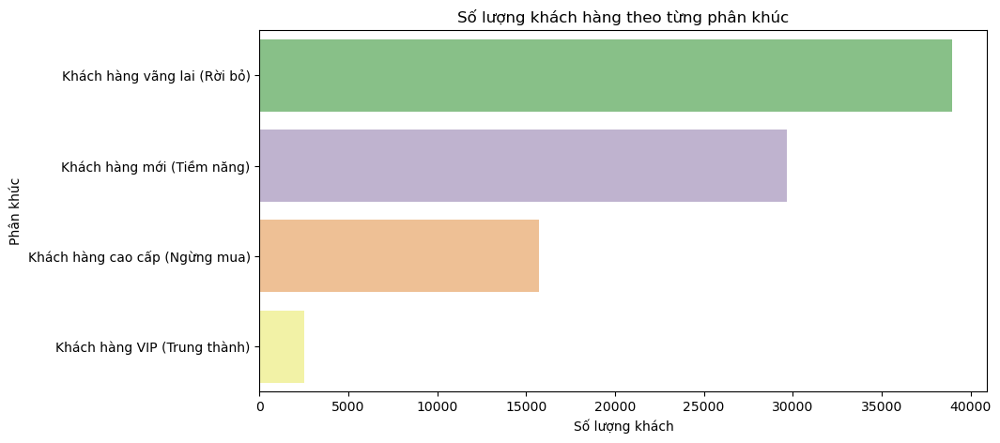

In [47]:
# Đặt tên 4 nhóm khách hàng
cluster_names = {
    0: 'Khách hàng vãng lai (Rời bỏ)',     
    1: 'Khách hàng cao cấp (Ngừng mua)',    
    2: 'Khách hàng mới (Tiềm năng)',      
    3: 'Khách hàng VIP (Trung thành)'   
}

# Áp dụng tên gọi vào cột Segment_Name
rfm_df['Segment_Name'] = rfm_df['Cluster'].map(cluster_names)

# Kiểm tra lại kết quả
print("\n--- KẾT QUẢ PHÂN KHÚC KHÁCH HÀNG ---")
display(rfm_df[['Cluster', 'Segment_Name', 'Recency', 'Frequency', 'Monetary']].head())

# Thống kê số lượng khách mỗi nhóm để xem nhóm nào đông nhất
segment_counts = rfm_df['Segment_Name'].value_counts().reset_index()
segment_counts.columns = ['Phân khúc', 'Số lượng khách']
display(segment_counts)

# Vẽ biểu đồ số lượng khách
plt.figure(figsize=(10, 5))
sns.barplot(x='Số lượng khách', y='Phân khúc', data=segment_counts, palette='Accent')
plt.title('Số lượng khách hàng theo từng phân khúc')
plt.show()

In [48]:
import plotly.express as px

# Chuẩn bị dữ liệu cho biểu đồ
# Chuyển cột Cluster sang dạng chuỗi (String) để Plotly hiểu đây là phân loại màu sắc (không phải số liên tục)
rfm_df['Cluster_Label'] = rfm_df['Cluster'].astype(str)

# Vẽ biểu đồ 3D bằng Plotly
fig = px.scatter_3d(
    rfm_df, 
    x='Recency', 
    y='Frequency', 
    z='Monetary',
    color='Cluster_Label',
    opacity=0.7,
    width=1000,
    height=800,
    
    title='Biểu đồ Phân khúc khách hàng 3D',
    labels={
        "Recency": "Recency (Số ngày)",
        "Frequency": "Frequency (Số đơn)",
        "Monetary": "Monetary (Tổng tiền)",
        "Cluster_Label": "Nhóm khách hàng"
    },
    color_discrete_sequence=px.colors.qualitative.Set1 
)

fig.update_traces(marker=dict(size=4))
fig.show()

# Lưu biểu đồ ra file HTML
fig.write_html("rfm_3d_plot.html")

# Xuất file kết quả dữ liệu
output_cols = ['customer_unique_id', 'Cluster', 'Recency', 'Frequency', 'Monetary']
rfm_df[output_cols].to_csv('clusters.csv', index=False)
print("Đã xuất file dữ liệu 'clusters.csv'.")

Đã xuất file dữ liệu 'clusters.csv'.


## 3.2. Khai phá luật kết hợp

In [42]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 103186 entries, 0 to 109995
Data columns (total 37 columns):
 #   Column                         Non-Null Count   Dtype   
---  ------                         --------------   -----   
 0   order_id                       103186 non-null  object  
 1   customer_id                    103186 non-null  object  
 2   order_status                   103186 non-null  object  
 3   order_purchase_timestamp       103186 non-null  object  
 4   order_approved_at              103186 non-null  object  
 5   order_delivered_carrier_date   103186 non-null  object  
 6   order_delivered_customer_date  103186 non-null  object  
 7   order_estimated_delivery_date  103186 non-null  object  
 8   order_item_id                  103186 non-null  float64 
 9   product_id                     103186 non-null  object  
 10  seller_id                      103186 non-null  object  
 11  shipping_limit_date            103186 non-null  object  
 12  price                

In [43]:
df

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,order_item_id,product_id,...,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,delivery_days,is_late,review_binary,review_group,delivery_group
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,1.0,87285b34884572647811a353c7ac498a,...,4.0,,"Não testei o produto ainda, mas ele veio corre...",2017-10-11 00:00:00,2017-10-12 03:43:48,8,0,1,High (4-5),On Time
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,1.0,595fac2a385ac33a80bd5114aec74eb8,...,4.0,Muito boa a loja,Muito bom o produto.,2018-08-08 00:00:00,2018-08-08 18:37:50,13,0,1,High (4-5),Late
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,1.0,aa4383b373c6aca5d8797843e5594415,...,5.0,,,2018-08-18 00:00:00,2018-08-22 19:07:58,9,0,1,High (4-5),On Time
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,1.0,d0b61bfb1de832b15ba9d266ca96e5b0,...,5.0,,O produto foi exatamente o que eu esperava e e...,2017-12-03 00:00:00,2017-12-05 19:21:58,13,0,1,High (4-5),Late
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26,1.0,65266b2da20d04dbe00c5c2d3bb7859e,...,5.0,,,2018-02-17 00:00:00,2018-02-18 13:02:51,2,0,1,High (4-5),Early
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
109991,63943bddc261676b46f01ca7ac2f7bd8,1fca14ff2861355f6e5f14306ff977a7,delivered,2018-02-06 12:58:58,2018-02-06 13:10:37,2018-02-07 23:22:42,2018-02-28 17:37:56,2018-03-02,1.0,f1d4ce8c6dd66c47bbaa8c6781c2a923,...,4.0,,So uma peça que veio rachado mas tudo bem rs,2018-03-01 00:00:00,2018-03-02 17:50:01,22,0,1,High (4-5),Late
109992,83c1379a015df1e13d02aae0204711ab,1aa71eb042121263aafbe80c1b562c9c,delivered,2017-08-27 14:46:43,2017-08-27 15:04:16,2017-08-28 20:52:26,2017-09-21 11:24:17,2017-09-27,1.0,b80910977a37536adeddd63663f916ad,...,5.0,,Foi entregue antes do prazo.,2017-09-22 00:00:00,2017-09-22 23:10:57,24,0,1,High (4-5),Late
109993,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,delivered,2018-01-08 21:28:27,2018-01-08 21:36:21,2018-01-12 15:35:03,2018-01-25 23:32:54,2018-02-15,1.0,d1c427060a0f73f6b889a5c7c61f2ac4,...,2.0,,Foi entregue somente 1. Quero saber do outro p...,2018-01-26 00:00:00,2018-01-27 09:16:56,17,0,0,Low (1-2),Late
109994,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,delivered,2018-01-08 21:28:27,2018-01-08 21:36:21,2018-01-12 15:35:03,2018-01-25 23:32:54,2018-02-15,2.0,d1c427060a0f73f6b889a5c7c61f2ac4,...,2.0,,Foi entregue somente 1. Quero saber do outro p...,2018-01-26 00:00:00,2018-01-27 09:16:56,17,0,0,Low (1-2),Late


In [44]:
import sys
!{sys.executable} -m pip install mlxtend

Defaulting to user installation because normal site-packages is not writeable



[notice] A new release of pip is available: 25.2 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


In [45]:
product_counts = df['product_category_name'].value_counts()

In [46]:
top10_products = product_counts.head(10)

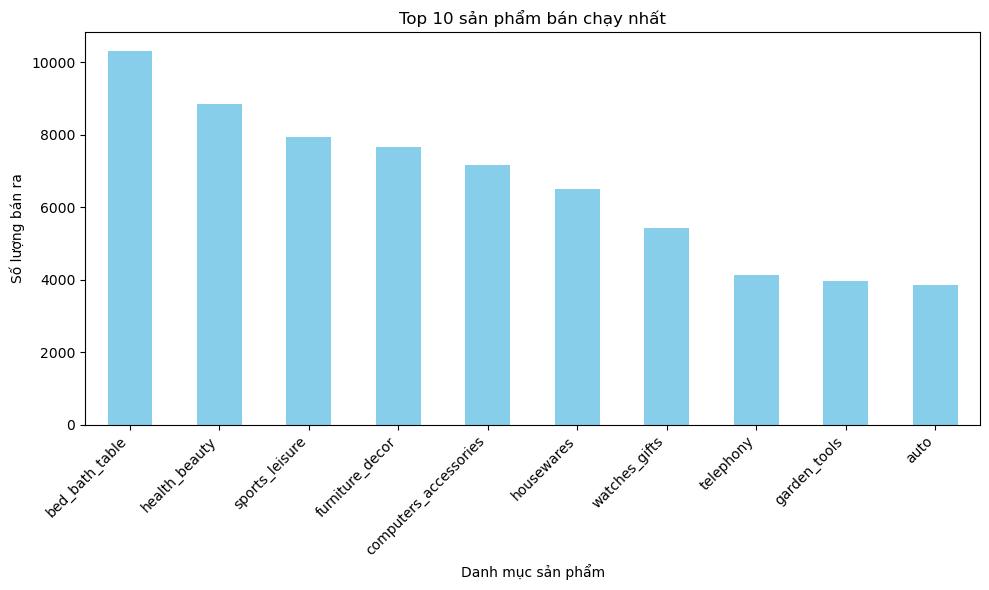

In [47]:
plt.figure(figsize=(10,6))
top10_products.plot(kind='bar', color='skyblue')
plt.title("Top 10 sản phẩm bán chạy nhất")
plt.xlabel("Danh mục sản phẩm")
plt.ylabel("Số lượng bán ra")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

In [48]:
order_counts = df.groupby('order_id')['product_category_name'].count()

In [49]:
top20_orders = order_counts.sort_values(ascending=False).head(20)

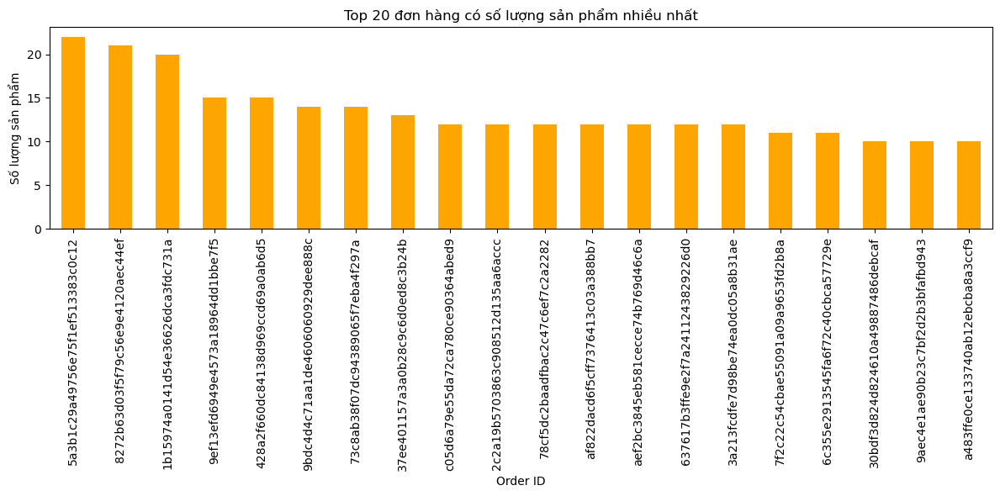

In [50]:
plt.figure(figsize=(12,6))
top20_orders.plot(kind='bar', color='orange')
plt.title("Top 20 đơn hàng có số lượng sản phẩm nhiều nhất")
plt.xlabel("Order ID")
plt.ylabel("Số lượng sản phẩm")
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

In [51]:
orders_multi_items = df.groupby('order_id')['product_category_name'].nunique()
orders_multi_items = orders_multi_items[orders_multi_items >= 2].index


In [52]:
df_filtered = df[df['order_id'].isin(orders_multi_items)]

In [53]:
df_filtered

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,order_item_id,product_id,...,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,delivery_days,is_late,review_binary,review_group,delivery_group
65,688052146432ef8253587b930b01a06d,81e08b08e5ed4472008030d70327c71f,delivered,2018-04-22 08:48:13,2018-04-24 18:25:22,2018-04-23 19:19:14,2018-04-24 19:31:58,2018-05-15,1.0,d1c427060a0f73f6b889a5c7c61f2ac4,...,4.0,Produto entregue em parte,Somente a Mala Pequena Bordo Avião 360º Viagem...,2018-04-25 00:00:00,2018-04-27 22:09:02,2,0,1,High (4-5),Early
66,688052146432ef8253587b930b01a06d,81e08b08e5ed4472008030d70327c71f,delivered,2018-04-22 08:48:13,2018-04-24 18:25:22,2018-04-23 19:19:14,2018-04-24 19:31:58,2018-05-15,2.0,db56f6d2b04c89eae4daba188842fd7b,...,4.0,Produto entregue em parte,Somente a Mala Pequena Bordo Avião 360º Viagem...,2018-04-25 00:00:00,2018-04-27 22:09:02,2,0,1,High (4-5),Early
134,f2fa3795760c35b8c05fa8e2f09d5143,fac60d7c4df3896a5af5db6c91e03797,delivered,2018-03-31 14:20:46,2018-04-03 05:10:21,2018-04-05 00:44:42,2018-04-07 00:06:33,2018-05-04,1.0,120fa011365fc39efe382cba4e50999e,...,3.0,,Só foi entregue 1 dos 3 produtos q comprei,2018-04-08 00:00:00,2018-04-08 17:18:09,6,0,0,Medium (3),On Time
135,f2fa3795760c35b8c05fa8e2f09d5143,fac60d7c4df3896a5af5db6c91e03797,delivered,2018-03-31 14:20:46,2018-04-03 05:10:21,2018-04-05 00:44:42,2018-04-07 00:06:33,2018-05-04,2.0,68a058d125ba1544e726898f0b8c0523,...,3.0,,Só foi entregue 1 dos 3 produtos q comprei,2018-04-08 00:00:00,2018-04-08 17:18:09,6,0,0,Medium (3),On Time
136,f2fa3795760c35b8c05fa8e2f09d5143,fac60d7c4df3896a5af5db6c91e03797,delivered,2018-03-31 14:20:46,2018-04-03 05:10:21,2018-04-05 00:44:42,2018-04-07 00:06:33,2018-05-04,3.0,eab67bf937aaadc19f83383a331d2dd9,...,3.0,,Só foi entregue 1 dos 3 produtos q comprei,2018-04-08 00:00:00,2018-04-08 17:18:09,6,0,0,Medium (3),On Time
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
109039,122ebb4ea3cb1281899533fc66f7d179,197291e1226b07030a319b27281fded0,delivered,2018-01-20 15:11:37,2018-01-22 13:51:46,2018-01-23 20:32:27,2018-01-25 23:09:12,2018-02-19,2.0,d1c427060a0f73f6b889a5c7c61f2ac4,...,5.0,,"Foi entregue o produto, conforme o previsto",2018-01-26 00:00:00,2018-03-05 17:26:38,5,0,1,High (4-5),On Time
109214,623906ceb400510974acad2860500532,bbfec30263d2f8e19e695453564a007a,delivered,2018-06-19 19:05:34,2018-06-19 19:35:56,2018-06-20 14:45:00,2018-06-25 18:03:14,2018-07-11,1.0,35afc973633aaeb6b877ff57b2793310,...,5.0,Muito bom,Otimo,2018-06-26 00:00:00,2018-06-27 15:59:11,5,0,1,High (4-5),On Time
109215,623906ceb400510974acad2860500532,bbfec30263d2f8e19e695453564a007a,delivered,2018-06-19 19:05:34,2018-06-19 19:35:56,2018-06-20 14:45:00,2018-06-25 18:03:14,2018-07-11,2.0,99a4788cb24856965c36a24e339b6058,...,5.0,Muito bom,Otimo,2018-06-26 00:00:00,2018-06-27 15:59:11,5,0,1,High (4-5),On Time
109237,48f3a0cfae19477fb7c023ef6e092dd1,76468fc2e290875c93f53af327982889,delivered,2018-03-19 10:05:40,2018-03-19 10:27:09,2018-03-20 17:52:11,2018-03-27 20:19:24,2018-04-06,1.0,fbc1488c1a1e72ba175f53ab29a248e8,...,5.0,,,2018-03-22 00:00:00,2018-03-24 21:59:11,8,0,1,High (4-5),On Time


In [54]:
transactions = df_filtered.groupby('order_id')['product_category_name'].apply(list)
transactions = transactions.tolist()

In [55]:
transactions

[['consoles_games', 'toys'],
 ['toys', 'baby', 'baby'],
 ['perfumery', 'sports_leisure'],
 ['bed_bath_table', 'housewares'],
 ['garden_tools', 'stationery'],
 ['health_beauty', 'market_place'],
 ['stationery', 'computers_accessories'],
 ['cool_stuff', 'sports_leisure'],
 ['kitchen_dining_laundry_garden_furniture', 'housewares'],
 ['cool_stuff', 'baby', 'baby'],
 ['computers_accessories', 'telephony'],
 ['furniture_decor', 'furniture_decor', 'musical_instruments'],
 ['housewares', 'health_beauty'],
 ['furniture_decor', 'furniture_decor', 'construction_tools_lights'],
 ['housewares', 'housewares', 'food_drink'],
 ['stationery', 'luggage_accessories'],
 ['cool_stuff', 'telephony'],
 ['perfumery', 'sports_leisure'],
 ['sports_leisure', 'housewares'],
 ['bed_bath_table', 'costruction_tools_garden'],
 ['health_beauty', 'baby'],
 ['audio', 'watches_gifts'],
 ['furniture_decor', 'home_construction'],
 ['bed_bath_table', 'furniture_decor'],
 ['furniture_decor', 'home_confort'],
 ['toys', 'perfu

In [56]:
from mlxtend.preprocessing import TransactionEncoder

te = TransactionEncoder()
te_ary = te.fit(transactions).transform(transactions)
basket = pd.DataFrame(te_ary, columns=te.columns_)

print("Kích thước ma trận:", basket.shape)

Kích thước ma trận: (762, 62)


In [57]:
from mlxtend.frequent_patterns import apriori

# min_support thử khoảng 0.01
frequent_itemsets = apriori(basket, min_support=0.01, use_colnames=True)

# Tính số lượng item trong mỗi itemset
frequent_itemsets['length'] = frequent_itemsets['itemsets'].apply(lambda x: len(x))

In [58]:
top_combo = frequent_itemsets[frequent_itemsets['length'] >= 2] \
            .sort_values(by='support', ascending=False) \
            .head(10)

print(top_combo)

     support                              itemsets  length
37  0.087927     (bed_bath_table, furniture_decor)       2
39  0.053806        (bed_bath_table, home_confort)       2
46  0.031496         (housewares, furniture_decor)       2
40  0.026247          (housewares, bed_bath_table)       2
35  0.024934                          (baby, toys)       2
33  0.023622                    (baby, cool_stuff)       2
32  0.022310                (baby, bed_bath_table)       2
44  0.020997       (furniture_decor, garden_tools)       2
49  0.018373       (sports_leisure, health_beauty)       2
45  0.017060  (furniture_decor, home_construction)       2


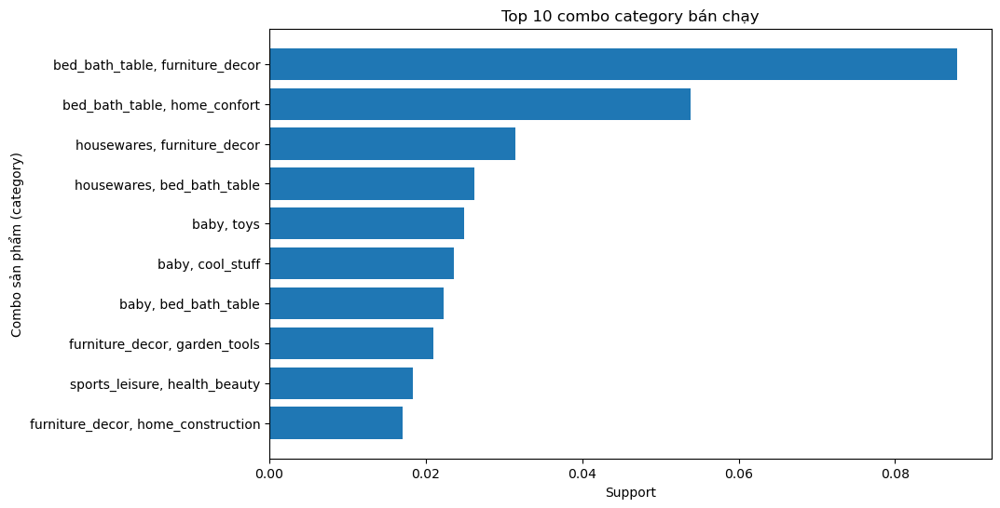

In [59]:
import matplotlib.pyplot as plt

# Chuyển frozenset sang chuỗi dễ đọc
top_combo['itemsets_str'] = top_combo['itemsets'].apply(lambda x: ', '.join(list(x)))

plt.figure(figsize=(10,6))
plt.barh(top_combo['itemsets_str'], top_combo['support'])
plt.xlabel('Support')
plt.ylabel('Combo sản phẩm (category)')
plt.title('Top 10 combo category bán chạy')
plt.gca().invert_yaxis()
plt.show()

In [60]:
from mlxtend.frequent_patterns import apriori, association_rules

# 1. Frequent itemsets từ 1 sản phẩm trở lên
frequent_itemsets_all = apriori(basket, min_support=0.01, use_colnames=True)
frequent_itemsets_all['length'] = frequent_itemsets_all['itemsets'].apply(lambda x: len(x))

# 2. Tạo luật kết hợp
rules = association_rules(frequent_itemsets_all, metric="confidence", min_threshold=0.025)

# 3. Chuyển frozenset sang string dễ đọc
rules['antecedents_str'] = rules['antecedents'].apply(lambda x: ', '.join(list(x)))
rules['consequents_str'] = rules['consequents'].apply(lambda x: ', '.join(list(x)))

# 4. Lọc chỉ combo ≥2 sản phẩm (tổng antecedent + consequent)
top_rules = rules[(rules['antecedents'].apply(len) + rules['consequents'].apply(len)) >= 2] \
             .sort_values(by='lift', ascending=False).head(10)

top_rules[['antecedents_str','consequents_str','support','confidence','lift']]

,antecedents_str,consequents_str,support,confidence,lift
22,unknown,fashion_bags_accessories,0.010499,0.140351,6.291022
23,fashion_bags_accessories,unknown,0.010499,0.470588,6.291022
33,health_beauty,perfumery,0.015748,0.166667,4.535714
32,perfumery,health_beauty,0.015748,0.428571,4.535714
15,home_confort,bed_bath_table,0.053806,0.854167,3.303934
14,bed_bath_table,home_confort,0.053806,0.208122,3.303934
6,baby,toys,0.024934,0.211111,3.282993
7,toys,baby,0.024934,0.387755,3.282993
2,baby,cool_stuff,0.023622,0.200000,2.381250
3,cool_stuff,baby,0.023622,0.281250,2.381250


In [63]:
# === 1. Tổng số luật sinh ra
total_rules = len(rules)

# === 2. Các thống kê cơ bản
mean_support = rules['support'].mean()
mean_confidence = rules['confidence'].mean()
mean_lift = rules['lift'].mean()

# === 3. Luật mạnh nhất (tối đa lift)
best_rule = rules.loc[rules['lift'].idxmax()][[
    'antecedents_str', 'consequents_str', 'support', 'confidence', 'lift'
]]

# === 4. Số luật mạnh (confidence ≥ 0.5, lift ≥ 2)
strong_rules = rules[
    (rules['confidence'] >= 0.5) &
    (rules['lift'] >= 2)
]
num_strong_rules = len(strong_rules)

# === 5. In kết quả
print("===== ĐÁNH GIÁ MÔ HÌNH LUẬT KẾT HỢP =====")
print(f"Tổng số luật sinh ra: {total_rules}")
print(f"Support trung bình: {mean_support:.4f}")
print(f"Confidence trung bình: {mean_confidence:.4f}")
print(f"Lift trung bình: {mean_lift:.4f}")
print(f"Số luật mạnh (confidence ≥ 0.5 & lift ≥ 2): {num_strong_rules}")
print("\nLuật mạnh nhất (theo lift):")
print(best_rule)

===== ĐÁNH GIÁ MÔ HÌNH LUẬT KẾT HỢP =====
Tổng số luật sinh ra: 40
Support trung bình: 0.0234
Confidence trung bình: 0.2141
Lift trung bình: 1.8755
Số luật mạnh (confidence ≥ 0.5 & lift ≥ 2): 2

Luật mạnh nhất (theo lift):
antecedents_str                     unknown
consequents_str    fashion_bags_accessories
support                            0.010499
confidence                         0.140351
lift                               6.291022
Name: 22, dtype: object


## 3.2. phân loại hài lòng của khách hàng

In [49]:
# 1. Import thư viện
# -------------------------
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import joblib
import time
import warnings
warnings.filterwarnings('ignore')

# sklearn
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV
from sklearn.tree import DecisionTreeClassifier, export_graphviz, plot_tree
from sklearn.ensemble import RandomForestClassifier
from sklearn.impute import SimpleImputer
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    classification_report, confusion_matrix, roc_auc_score, roc_curve
)

# graphviz python API
import graphviz

RND = 42
np.random.seed(RND)

In [50]:
df = pd.read_csv("master_data.csv") 

In [51]:
# Cần fillna(0) hoặc fillna(trung bình) để tránh lỗi nhân với Null
df['product_volume_cm3'] = (
    df['product_length_cm'].fillna(0) * df['product_height_cm'].fillna(0) * df['product_width_cm'].fillna(0)
)

In [52]:
potential_features = [
    'price', 'freight_value', 'delivery_days', 'is_late',
    'product_weight_g', 'product_volume_cm3', 'payment_value_sum', 'payment_count'
]
features = [c for c in potential_features if c in df.columns]
target = 'review_binary'

In [53]:
# 3. Loại bỏ hàng không có target nếu còn
# -------------------------
df = df.dropna(subset=[target])
X = df[features].copy()
y = df[target].copy()

In [54]:
# 4. CHIA TRAIN/TEST (STRATIFY)
# -------------------------
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=RND, stratify=y
)
print("Kích thước train/test:", X_train.shape, X_test.shape)

Kích thước train/test: (88009, 6) (22003, 6)


In [55]:
# 1.5 Xử lý dữ liệu thiếu (Imputation)
# Fit trên Train, Transform trên Test để tránh Data Leakage
imputer = SimpleImputer(strategy='median')
X_train_imp = pd.DataFrame(imputer.fit_transform(X_train), columns=features)
X_test_imp = pd.DataFrame(imputer.transform(X_test), columns=features)

In [56]:
# 5. IMPUTATION (Fit trên TRAIN, transform trên TEST)
# -------------------------
imputer = SimpleImputer(strategy='median')
X_train_imp = pd.DataFrame(imputer.fit_transform(X_train), columns=features, index=X_train.index)
X_test_imp  = pd.DataFrame(imputer.transform(X_test), columns=features, index=X_test.index)

joblib.dump(imputer, "imputer_master.joblib")
print("Saved imputer: imputer_master.joblib")

Saved imputer: imputer_master.joblib


In [57]:
# 6. Hàm in metrics & vẽ hỗ trợ
# -------------------------
def print_metrics(y_true, y_pred, y_proba=None, label="Model"):
    print(f"\n=== Metrics: {label} ===")
    print("Accuracy :", round(accuracy_score(y_true, y_pred),4))
    print("Precision:", round(precision_score(y_true, y_pred, zero_division=0),4))
    print("Recall   :", round(recall_score(y_true, y_pred, zero_division=0),4))
    print("F1-score :", round(f1_score(y_true, y_pred, zero_division=0),4))
    if y_proba is not None:
        try:
            print("ROC AUC  :", round(roc_auc_score(y_true, y_proba),4))
        except:
            pass
    print("\nClassification report:\n", classification_report(y_true, y_pred, zero_division=0))

def plot_confusion(y_true, y_pred, title="Confusion Matrix"):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(5,4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
    plt.title(title)
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()

In [58]:
# NHIỆM VỤ 1: Decision Tree (sklearn) + hiển thị Graphviz
# ============================
print("\n>> NHIỆM VỤ 1: Huấn luyện Decision Tree (sklearn) và vẽ bằng graphviz")

# 1.1 Tạo model baseline (có thể thay tham số nếu cần)
dt_baseline = DecisionTreeClassifier(max_depth=5, random_state=RND)
dt_baseline.fit(X_train_imp, y_train)

# 1.2 Đánh giá baseline trên test
y_pred_dt_base = dt_baseline.predict(X_test_imp)
y_proba_dt_base = dt_baseline.predict_proba(X_test_imp)[:,1] if hasattr(dt_baseline, "predict_proba") else None
print_metrics(y_test, y_pred_dt_base, y_proba_dt_base, label="Decision Tree (baseline)")

# 1.3 Xuất cây sang DOT và hiển thị bằng graphviz (yêu cầu graphviz hệ thống)
dot_data = export_graphviz(
    dt_baseline,
    out_file=None,
    feature_names=features,
    class_names=['NotSatisfied','Satisfied'],
    filled=True, rounded=True,
    special_characters=True
)
graph = graphviz.Source(dot_data)
# Hiển thị trong notebook
display(graph)

# (Nếu muốn lưu file .pdf hoặc .png)
graph.render("decision_tree_baseline", format="pdf", cleanup=True)
print("Saved tree visualization: decision_tree_baseline.pdf")


>> NHIỆM VỤ 1: Huấn luyện Decision Tree (sklearn) và vẽ bằng graphviz

=== Metrics: Decision Tree (baseline) ===
Accuracy : 0.796
Precision: 0.8026
Recall   : 0.9739
F1-score : 0.88
ROC AUC  : 0.6573

Classification report:
               precision    recall  f1-score   support

           0       0.71      0.21      0.32      5104
           1       0.80      0.97      0.88     16899

    accuracy                           0.80     22003
   macro avg       0.75      0.59      0.60     22003
weighted avg       0.78      0.80      0.75     22003



ExecutableNotFound: failed to execute WindowsPath('dot'), make sure the Graphviz executables are on your systems' PATH

ExecutableNotFound: failed to execute WindowsPath('dot'), make sure the Graphviz executables are on your systems' PATH

In [59]:
# Kiểm tra các biến RF đã có trong môi trường chưa
print('best_rf' in globals())
print('y_pred_rf' in globals())
print('y_proba_rf' in globals())

False
False
False



>> NHIỆM VỤ 2: GridSearchCV tối ưu Decision Tree và vẽ đánh giá tham số
Fitting 5 folds for each of 224 candidates, totalling 1120 fits
GridSearchCV hoàn thành trong 149.3s
Best params (DT): {'criterion': 'entropy', 'max_depth': 4, 'min_samples_leaf': 1, 'min_samples_split': 2}
Best CV F1 (DT): 0.8811018816977569

=== Metrics: Decision Tree (tuned) ===
Accuracy : 0.795
Precision: 0.7977
Recall   : 0.9822
F1-score : 0.8804
ROC AUC  : 0.6509

Classification report:
               precision    recall  f1-score   support

           0       0.75      0.18      0.28      5104
           1       0.80      0.98      0.88     16899

    accuracy                           0.80     22003
   macro avg       0.77      0.58      0.58     22003
weighted avg       0.79      0.80      0.74     22003



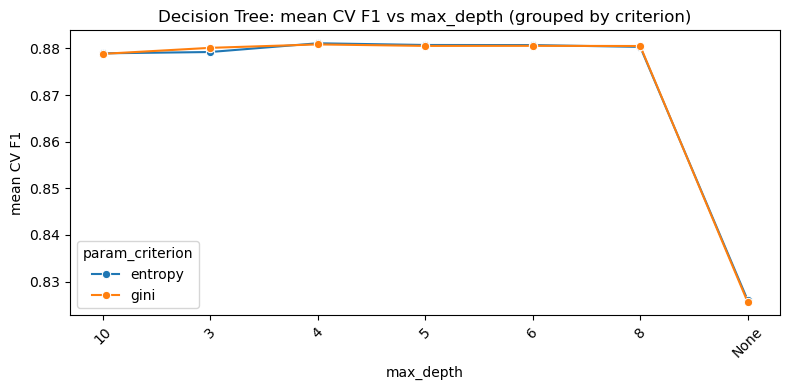

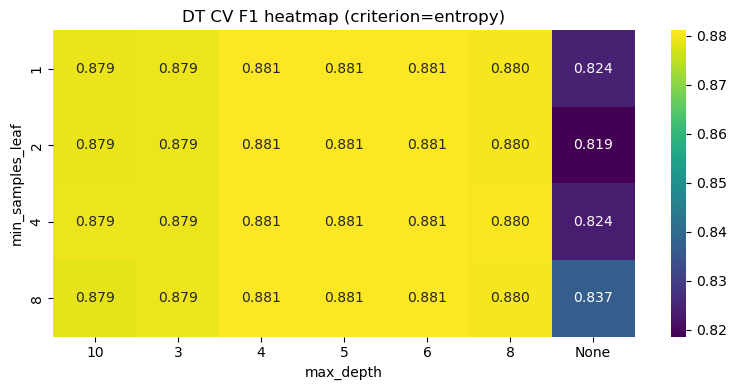

In [60]:
# NHIỆM VỤ 2: GridSearchCV cho Decision Tree + vẽ ảnh hưởng max_depth
# ============================
print("\n>> NHIỆM VỤ 2: GridSearchCV tối ưu Decision Tree và vẽ đánh giá tham số")

# 2.1 Grid param
param_grid_dt = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [3,4,5,6,8,10,None],
    'min_samples_split': [2,5,10,20],
    'min_samples_leaf': [1,2,4,8]
}

grid_dt = GridSearchCV(
    estimator=DecisionTreeClassifier(random_state=RND),
    param_grid=param_grid_dt,
    scoring='f1',   # ưu tiên f1 cho imbalance
    cv=5,
    n_jobs=-1,
    verbose=1,
    return_train_score=True
)

t0 = time.time()
grid_dt.fit(X_train_imp, y_train)
t1 = time.time()
print(f"GridSearchCV hoàn thành trong {t1-t0:.1f}s")
print("Best params (DT):", grid_dt.best_params_)
print("Best CV F1 (DT):", grid_dt.best_score_)

best_dt = grid_dt.best_estimator_

# 2.2 Đánh giá best_dt trên tập test
y_pred_dt = best_dt.predict(X_test_imp)
y_proba_dt = best_dt.predict_proba(X_test_imp)[:,1] if hasattr(best_dt,'predict_proba') else None
print_metrics(y_test, y_pred_dt, y_proba_dt, label="Decision Tree (tuned)")

# 2.3 Vẽ đồ thị: mean CV F1 vs max_depth (nhóm theo criterion)
res_dt = pd.DataFrame(grid_dt.cv_results_)
res_dt['param_max_depth_str'] = res_dt['param_max_depth'].astype(str)
agg = res_dt.groupby(['param_max_depth_str','param_criterion'])['mean_test_score'].mean().reset_index()

plt.figure(figsize=(8,4))
sns.lineplot(data=agg, x='param_max_depth_str', y='mean_test_score', hue='param_criterion', marker='o')
plt.title('Decision Tree: mean CV F1 vs max_depth (grouped by criterion)')
plt.xlabel('max_depth')
plt.ylabel('mean CV F1')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# 2.4 Heatmap: min_samples_leaf x max_depth cho criterion tốt nhất (trực quan)
best_crit = res_dt.loc[res_dt['mean_test_score'].idxmax(), 'param_criterion']
pivot = res_dt[res_dt['param_criterion']==best_crit].pivot_table(index='param_min_samples_leaf', columns='param_max_depth_str', values='mean_test_score')
plt.figure(figsize=(8,4))
sns.heatmap(pivot, annot=True, fmt=".3f", cmap='viridis')
plt.title(f'DT CV F1 heatmap (criterion={best_crit})')
plt.xlabel('max_depth')
plt.ylabel('min_samples_leaf')
plt.tight_layout()
plt.show()


>> NHIỆM VỤ 3: Random Forest - training, tuning, evaluate

=== Metrics: RandomForest (baseline) ===
Accuracy : 0.8241
Precision: 0.8414
Recall   : 0.9501
F1-score : 0.8924
ROC AUC  : 0.7507

Classification report:
               precision    recall  f1-score   support

           0       0.71      0.41      0.52      5104
           1       0.84      0.95      0.89     16899

    accuracy                           0.82     22003
   macro avg       0.78      0.68      0.71     22003
weighted avg       0.81      0.82      0.81     22003

Fitting 3 folds for each of 25 candidates, totalling 75 fits
RandomizedSearchCV hoàn tất trong 1082.0s
Best params (RF): {'n_estimators': 200, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_depth': None, 'criterion': 'gini'}
Best CV F1 (RF): 0.8912460084037407

=== Metrics: RandomForest (tuned) ===
Accuracy : 0.8248
Precision: 0.8355
Recall   : 0.9611
F1-score : 0.8939
ROC AUC  : 0.75

Classification report:
               precision    recall  f1-s

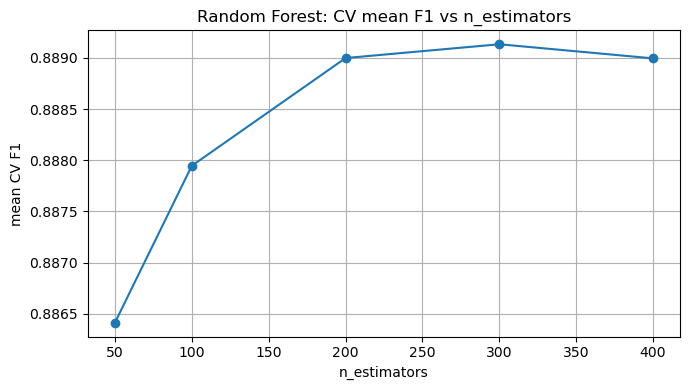


Best RF params: {'n_estimators': 200, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_depth': None, 'criterion': 'gini'}


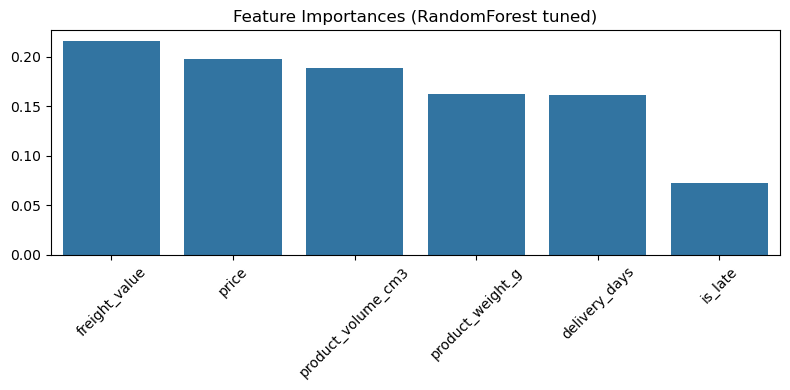

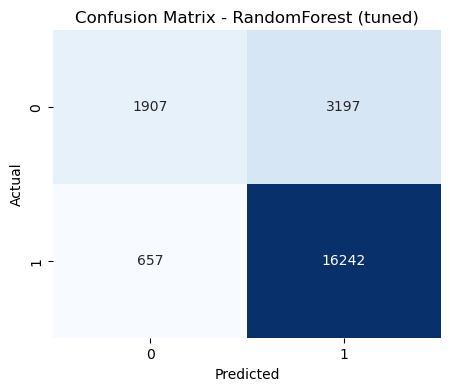

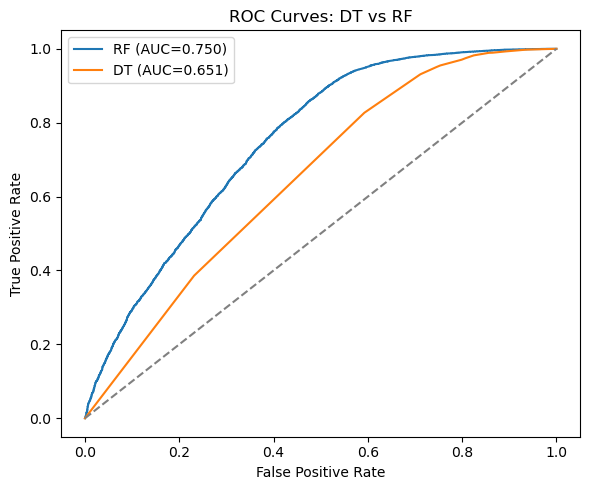

In [61]:
# NHIỆM VỤ 3: Random Forest (build + tune + evaluate + plots)
# ============================
print("\n>> NHIỆM VỤ 3: Random Forest - training, tuning, evaluate")

# 3.1 Tạo RandomForest mặc định & train (làm baseline)
rf_baseline = RandomForestClassifier(n_estimators=100, random_state=RND, n_jobs=-1)
rf_baseline.fit(X_train_imp, y_train)
y_pred_rf_base = rf_baseline.predict(X_test_imp)
y_proba_rf_base = rf_baseline.predict_proba(X_test_imp)[:,1]
print_metrics(y_test, y_pred_rf_base, y_proba_rf_base, label="RandomForest (baseline)")

# 3.2 Tuning RandomForest: dùng RandomizedSearchCV (tốc độ) - bạn có thể đổi sang GridSearchCV nếu muốn
from scipy.stats import randint
param_dist_rf = {
    'n_estimators': [100,200,300,400],
    'max_depth': [None, 10, 15, 20],
    'min_samples_split': [2,5,10],
    'min_samples_leaf': [1,2,4],
    'criterion': ['gini','entropy']
}

rand_rf = RandomizedSearchCV(
    estimator=RandomForestClassifier(random_state=RND, n_jobs=-1),
    param_distributions=param_dist_rf,
    n_iter=25,
    scoring='f1',
    cv=3,
    random_state=RND,
    n_jobs=-1,
    verbose=1
)

t0 = time.time()
rand_rf.fit(X_train_imp, y_train)
t1 = time.time()
print(f"RandomizedSearchCV hoàn tất trong {t1-t0:.1f}s")
print("Best params (RF):", rand_rf.best_params_)
print("Best CV F1 (RF):", rand_rf.best_score_)

best_rf = rand_rf.best_estimator_

# 3.3 Train lại best_rf (đảm bảo)
best_rf.fit(X_train_imp, y_train)

# 3.4 Đánh giá best_rf trên test
y_pred_rf = best_rf.predict(X_test_imp)
y_proba_rf = best_rf.predict_proba(X_test_imp)[:,1]
print_metrics(y_test, y_pred_rf, y_proba_rf, label="RandomForest (tuned)")

# 3.5 Vẽ biểu đồ: ảnh hưởng số cây n_estimators -> để làm được chính xác, ta có thể thử một loạt n_estimators và cross-val điểm
# (ở đây ta dùng nhanh: với các giá trị cố định, tính CV f1 bằng cross_val_score - hoặc dùng rand_rf.cv_results_)
vals = [50,100,200,300,400]
from sklearn.model_selection import cross_val_score
cv_scores = []
for n in vals:
    rf_temp = RandomForestClassifier(n_estimators=n, random_state=RND, n_jobs=-1)
    sc = cross_val_score(rf_temp, X_train_imp, y_train, cv=3, scoring='f1', n_jobs=-1)
    cv_scores.append(sc.mean())
plt.figure(figsize=(7,4))
plt.plot(vals, cv_scores, marker='o')
plt.title('Random Forest: CV mean F1 vs n_estimators')
plt.xlabel('n_estimators')
plt.ylabel('mean CV F1')
plt.grid(True)
plt.tight_layout()
plt.show()

# 3.6 Hiển thị tham số tốt nhất & feature importances
print("\nBest RF params:", rand_rf.best_params_)
importances = best_rf.feature_importances_
indices = np.argsort(importances)[::-1]
plt.figure(figsize=(8,4))
sns.barplot(x=[features[i] for i in indices], y=importances[indices])
plt.xticks(rotation=45)
plt.title('Feature Importances (RandomForest tuned)')
plt.tight_layout()
plt.show()

# 3.7 Confusion matrix & ROC cho best_rf
plot_confusion(y_test, y_pred_rf, title="Confusion Matrix - RandomForest (tuned)")
fpr, tpr, _ = roc_curve(y_test, y_proba_rf)
plt.figure(figsize=(6,5))
plt.plot(fpr, tpr, label=f'RF (AUC={roc_auc_score(y_test, y_proba_rf):.3f})')
if y_proba_dt is not None:
    fpr_dt, tpr_dt, _ = roc_curve(y_test, y_proba_dt)
    plt.plot(fpr_dt, tpr_dt, label=f'DT (AUC={roc_auc_score(y_test, y_proba_dt):.3f})')
plt.plot([0,1],[0,1], linestyle='--', color='gray')
plt.xlabel('False Positive Rate'); plt.ylabel('True Positive Rate')
plt.title('ROC Curves: DT vs RF')
plt.legend()
plt.tight_layout()
plt.show()

In [62]:
# 8. Bảng so sánh tổng quát
print("\n=== SO SÁNH TỔNG QUAN TRÊN TẬP TEST ===")
print("Decision Tree (tuned): ACC", round(accuracy_score(y_test, y_pred_dt),4), 
      "F1", round(f1_score(y_test, y_pred_dt, zero_division=0),4))
print("Random Forest (tuned): ACC", round(accuracy_score(y_test, y_pred_rf),4), 
      "F1", round(f1_score(y_test, y_pred_rf, zero_division=0),4))


=== SO SÁNH TỔNG QUAN TRÊN TẬP TEST ===
Decision Tree (tuned): ACC 0.795 F1 0.8804
Random Forest (tuned): ACC 0.8248 F1 0.8939


In [63]:
from imblearn.over_sampling import SMOTE
from collections import Counter

print("Before SMOTE:", Counter(y_train))

smote = SMOTE(random_state=RND)
X_train_sm, y_train_sm = smote.fit_resample(X_train_imp, y_train)

print("After SMOTE:", Counter(y_train_sm))

Before SMOTE: Counter({1: 67592, 0: 20417})
After SMOTE: Counter({0: 67592, 1: 67592})


In [64]:
# PHẦN 2 – TRAIN + TUNE RANDOM FOREST TRÊN DATA ĐÃ BALANCE
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier

param_dist = {
    'n_estimators': [100,200],
    'max_depth' : [None,10,20],
    'min_samples_split': [2,5],
    'min_samples_leaf': [1,2],
    'max_features': ['sqrt'],
    'class_weight': ['balanced']
}

rf_balanced = RandomForestClassifier(
    random_state=RND,
    n_jobs=2
)

rand_rf = RandomizedSearchCV(
    estimator=rf_balanced,
    param_distributions=param_dist,
    n_iter=12,
    scoring='f1',
    cv=3,
    random_state=RND,
    n_jobs=2,
    verbose=1
)

rand_rf.fit(X_train_sm, y_train_sm)

best_rf_balanced = rand_rf.best_estimator_

print("\nBest RF Balanced params:")
print(rand_rf.best_params_)

print("Best CV F1:")
print(rand_rf.best_score_)

Fitting 3 folds for each of 12 candidates, totalling 36 fits

Best RF Balanced params:
{'n_estimators': 200, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_features': 'sqrt', 'max_depth': None, 'class_weight': 'balanced'}
Best CV F1:
0.8672578730876156


In [65]:
# PHẦN 3 – ĐÁNH GIÁ MÔ HÌNH RF SAU XỬ LÝ IMBALANCE
from sklearn.metrics import classification_report, roc_auc_score

y_pred = best_rf_balanced.predict(X_test_imp)
y_proba = best_rf_balanced.predict_proba(X_test_imp)[:,1]

print_metrics(y_test, y_pred, y_proba, label="Random Forest (SMOTE + tuned)")

print("\nClassification Report:")
print(classification_report(y_test, y_pred))


=== Metrics: Random Forest (SMOTE + tuned) ===
Accuracy : 0.8108
Precision: 0.8435
Recall   : 0.9254
F1-score : 0.8825
ROC AUC  : 0.7482

Classification report:
               precision    recall  f1-score   support

           0       0.64      0.43      0.51      5104
           1       0.84      0.93      0.88     16899

    accuracy                           0.81     22003
   macro avg       0.74      0.68      0.70     22003
weighted avg       0.80      0.81      0.80     22003


Classification Report:
              precision    recall  f1-score   support

           0       0.64      0.43      0.51      5104
           1       0.84      0.93      0.88     16899

    accuracy                           0.81     22003
   macro avg       0.74      0.68      0.70     22003
weighted avg       0.80      0.81      0.80     22003



In [66]:
import pandas as pd
from sklearn.metrics import classification_report
import numpy as np 


# BƯỚC 1: TẠO DỰ ĐOÁN CHO MÔ HÌNH RF (SMOTE + TUNED) (Lặp lại để đầy đủ)
# *******************************************************************
try:
    # Dự đoán cho RF (SMOTE + TunED)
    y_pred_rf_smote_tuned = best_rf_balanced.predict(X_test_imp)
except NameError:
    print("Lỗi: Các biến 'X_test_imp', 'best_rf_balanced' hoặc 'y_test' chưa được định nghĩa.")
    exit() 
except Exception as e:
    print(f"Lỗi xảy ra khi dự đoán bằng best_rf_balanced: {e}")
    exit()

# *******************************************************************
# BƯỚC 2: HÀM SO SÁNH VÀ HIỂN THỊ KẾT QUẢ 
# *******************************************************************

def compare_rf_models(y_test, y_preds_dict):
    """
    Tạo DataFrame so sánh F1 tổng thể, Recall Lớp 0 và F1 Lớp 0 giữa các mô hình.
    Đã sửa lỗi AttributeError: 'Styler' object has no attribute 'sort_values'.
    """
    comparison = {}
    
    for name, y_pred in y_preds_dict.items():
        # Lấy báo cáo phân loại chi tiết
        report = classification_report(y_test, y_pred, output_dict=True, zero_division=0)
        
        # Lấy các chỉ số quan trọng
        recall_class_0 = report['0']['recall']
        f1_class_0 = report['0']['f1-score']
        f1_weighted = report['weighted avg']['f1-score']
        
        comparison[name] = {
            'F1-score Tổng thể (Weighted Avg)': f1_weighted,
            'Recall Lớp 0 (Mục tiêu)': recall_class_0,
            'F1-score Lớp 0': f1_class_0
        }
    
    df_comparison = pd.DataFrame(comparison).T
    
    # 1. Sắp xếp DataFrame GỐC trước khi định dạng
    df_comparison = df_comparison.sort_values(by='Recall Lớp 0 (Mục tiêu)', ascending=False)
    
    # 2. Áp dụng định dạng và trả về đối tượng Styler
    return df_comparison.style.format({
        'F1-score Tổng thể (Weighted Avg)': "{:.4f}",
        'Recall Lớp 0 (Mục tiêu)': "{:.4f}",
        'F1-score Lớp 0': "{:.4f}"
    })


# *******************************************************************
# BƯỚC 3: THỰC HIỆN SO SÁNH
# *******************************************************************

# Dictionary chứa các kết quả dự đoán (y_pred) đã được tạo
y_preds_to_compare = {
    "RF (SMOTE + Tuned)": y_pred_rf_smote_tuned,
    "RF (Đã Tune, Không SMOTE)": y_pred_rf,
    "RF (Baseline, Mặc định)": y_pred_rf_base
}

print("\n=== KẾT QUẢ SO SÁNH HIỆU SUẤT RF (Tập trung vào Lớp 0) ===")
# Bây giờ, comparison_table là đối tượng Styler đã được sắp xếp.
comparison_table = compare_rf_models(y_test, y_preds_to_compare)
print(comparison_table)


=== KẾT QUẢ SO SÁNH HIỆU SUẤT RF (Tập trung vào Lớp 0) ===


In [67]:
comparison_table

,F1-score Tổng thể (Weighted Avg),Recall Lớp 0 (Mục tiêu),F1-score Lớp 0
RF (SMOTE + Tuned),0.7971,0.4314,0.5141
"RF (Baseline, Mặc định)",0.8055,0.4069,0.5176
"RF (Đã Tune, Không SMOTE)",0.8020,0.3736,0.4974


In [68]:
joblib.dump(best_dt, "best_dt_model.pkl")
joblib.dump(best_rf, "best_rf_model.pkl")
joblib.dump(rand_rf, "randsearch_rf.pkl")
joblib.dump(grid_dt, "gridsearch_dt.pkl")
print("Saved models & search objects.")

Saved models & search objects.
